# Rainfall Prediction - Weather Forecasting
### Problem Statement:
Rain Prediction –Weather forecasting
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

Problem Statement:
Target:

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

## Dataset Description:
Number of columns: 23

Date - The date of observation

Location -The common name of the location of the weather station

MinTemp -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall -The amount of rainfall recorded for the day in mm

Evaporation -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine -The number of hours of bright sunshine in the day.

WindGustDir- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am.

Cloud3pm -Fraction of sky obscured by cloud

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing  import power_transform, StandardScaler, LabelEncoder
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor,Ridge, Lasso
from sklearn.metrics import roc_curve, auc, roc_auc_score,plot_roc_curve, r2_score, accuracy_score,classification_report, confusion_matrix, mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.svm import SVR, SVC
from sklearn.tree import DecisionTreeClassifier
import pickle
import warnings
warnings.filterwarnings('ignore')

In [11]:
df = pd.read_csv('weatherAUS.csv')

In [12]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [13]:
#To print all columns
pd.set_option('display.max_columns',None)

In [14]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


##  EDA

In [15]:
# Checking Total Numbers of Rows and Column
df.shape

(8425, 23)

In [16]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [17]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [18]:
# Checking for Null Values

In [19]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

We can see except 2 columns Null Value is present in all columns and column name are:
'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow'

<AxesSubplot:>

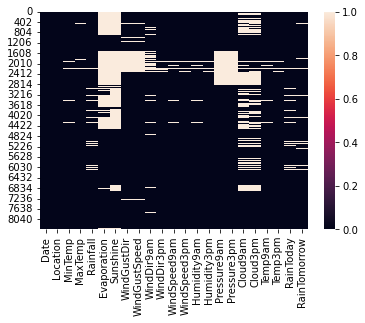

In [20]:
sns.heatmap(df.isnull())

We can see here also that Null Values are present in our dataset.

#  Information about Data (Memory Used and Data Types)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

Checking for ? values if present in our dataset or not

In [22]:
(df==' ?').sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

We can see there are no ? values present in our dataset

### Checking whether the dataset contains any space

In [23]:
df[df['RainTomorrow'] == '']

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow


In [24]:
df[df['Rainfall'] == '']

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow


In [25]:
#  So we can see there are no spaces present in the dataset

In [26]:
#  Checking for blank value in our Target Column

In [27]:
df[df['RainTomorrow'] == ''].index

Int64Index([], dtype='int64')

In [28]:
df[df['Rainfall'] == ''].index

Int64Index([], dtype='int64')

#  So, we can check there are no blank value present in our Target Column

#   Checking values of Target Variable.

In [30]:
df['RainTomorrow'].value_counts()

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

In [31]:
df['Rainfall'].value_counts()

0.0      5299
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

In [32]:
#  Checking unique values present in the Target Variable.

In [33]:
df['RainTomorrow'].unique()

array(['No', 'Yes', nan], dtype=object)

In [34]:
df['Rainfall'].unique()

array([6.000e-01, 0.000e+00, 1.000e+00, 2.000e-01, 1.400e+00, 2.200e+00,
       1.560e+01, 3.600e+00,       nan, 1.680e+01, 1.060e+01, 1.200e+00,
       8.000e-01, 6.400e+00, 4.000e-01, 3.000e+00, 5.800e+00, 1.160e+01,
       1.800e+00, 8.600e+00, 1.260e+01, 8.400e+00, 6.200e+00, 2.000e+01,
       2.100e+01, 3.200e+00, 4.800e+00, 4.200e+00, 8.000e+00, 1.440e+01,
       4.600e+00, 2.000e+00, 5.600e+00, 1.600e+00, 6.000e+00, 4.400e+00,
       5.400e+00, 5.000e+00, 7.800e+00, 6.800e+00, 9.800e+00, 3.800e+00,
       2.400e+00, 5.200e+00, 6.600e+00, 1.340e+01, 1.020e+01, 2.880e+01,
       7.000e+00, 2.580e+01, 9.400e+00, 1.240e+01, 5.220e+01, 2.060e+01,
       6.600e+01, 1.100e+01, 1.700e+01, 1.040e+01, 2.800e+01, 2.140e+01,
       1.860e+01, 7.200e+00, 8.200e+00, 1.080e+01, 1.540e+01, 9.600e+00,
       4.000e+00, 2.180e+01, 2.080e+01, 2.480e+01, 1.000e+01, 1.140e+01,
       1.900e+01, 2.220e+01, 3.280e+01, 3.400e+00, 5.080e+01, 5.260e+01,
       1.920e+01, 1.880e+01, 1.480e+01, 1.200e+01, 

In [35]:
df['RainTomorrow'].nunique()

2

In [36]:
df['Rainfall'].nunique()

250

In [37]:
#  Checking unique elements of each columns

In [38]:
df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

In [39]:
#  Descriptive Statistics

In [40]:
# Description of Dataset : works only on continuous column 
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


#### So, we can see that only 16 column is containing continuous data and rest 7 column contains categorical data.

In [41]:
#   Checking Description through heatmap also.

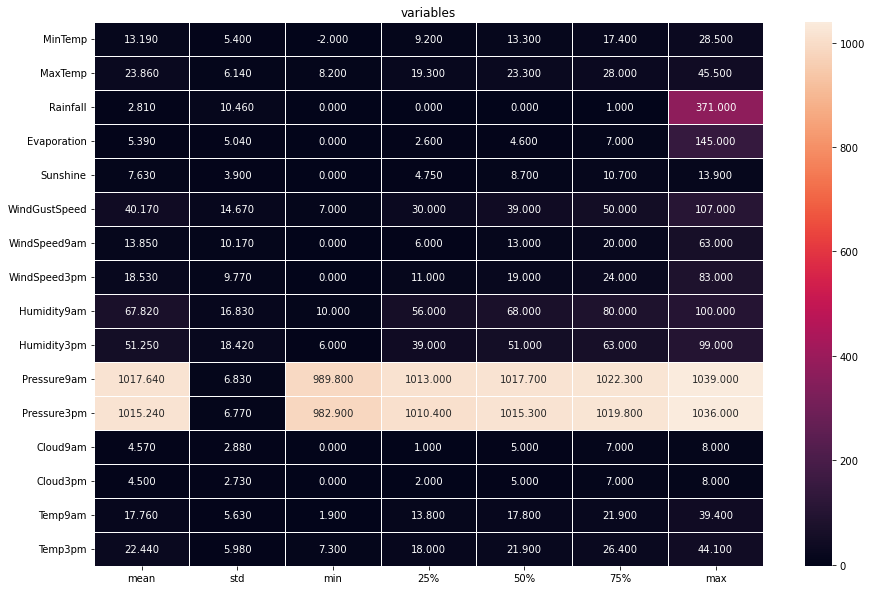

In [43]:
plt.figure(figsize=(15,10))
sns.heatmap(round(df.describe()[1:].transpose(),2),linewidth=1,annot=True,fmt='.3f')
plt.xticks(fontsize=14)
plt.xticks(fontsize=10)
plt.title('variables')
plt.show()

In [45]:
#   Observation of Describe of Datasets:
#   The summary of this dataset looks good as there are no negative value present.
#   Total No of Rows: 8425 and Total No. of Columns: 23
#   We can see there are null values present in our dataset as Total count is not matching with Total no of rows of our datset of all continuous columns: MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm.
#   We are determining Mean, Standard Deviation, Minimum and Maximum Values of each column in description of dataset.
#   We can also see skewness and outliers are present.'''

In [46]:
#   Data Cleaning and preprocessing
#   Since there are Null values in the dataset, so we need to treat them.

#   checking total percentage of null values in each column of dataset

In [48]:
df.isnull().sum()/df.shape[0]*100

Date              0.000000
Location          0.000000
MinTemp           0.890208
MaxTemp           0.712166
Rainfall          2.848665
Evaporation      41.685460
Sunshine         47.406528
WindGustDir      11.762611
WindGustSpeed    11.762611
WindDir9am        9.839763
WindDir3pm        3.655786
WindSpeed9am      0.902077
WindSpeed3pm      1.270030
Humidity9am       0.700297
Humidity3pm       1.210682
Pressure9am      15.537092
Pressure3pm      15.572700
Cloud9am         28.735905
Cloud3pm         29.139466
Temp9am           0.664688
Temp3pm           1.139466
RainToday         2.848665
RainTomorrow      2.836795
dtype: float64

In [49]:
df['Evaporation'].value_counts()

4.0     180
3.0     163
2.4     147
2.2     146
2.6     143
       ... 
17.0      1
18.6      1
22.4      1
19.2      1
0.7       1
Name: Evaporation, Length: 116, dtype: int64

In [50]:
df['Sunshine'].value_counts()

0.0     166
11.1     68
11.2     67
11.0     66
10.7     64
       ... 
2.5       8
13.6      7
13.8      4
13.9      3
13.5      2
Name: Sunshine, Length: 140, dtype: int64

In [51]:
df['Cloud9am'].value_counts()

7.0    1418
1.0    1038
8.0    1015
0.0     554
6.0     551
5.0     414
3.0     384
2.0     357
4.0     273
Name: Cloud9am, dtype: int64

In [52]:
df['Cloud3pm'].value_counts()

7.0    1294
1.0    1077
8.0     863
6.0     597
5.0     522
2.0     508
3.0     411
4.0     351
0.0     347
Name: Cloud3pm, dtype: int64

here the 4 columns(Evaporation,Sunshine,Cloud9am,Cloud3pm) have less than 50% missing data. If we drop these column then our approx 50% data will be lost, So we’ll use them in our model with proper imputation and will drop rest column's rows.

In [54]:
def randomsampleimputation(df, variable):
    df[variable]=df[variable]
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable]=random_sample
    
    
randomsampleimputation(df, "Cloud9am")
randomsampleimputation(df, "Cloud3pm")
randomsampleimputation(df, "Evaporation")
randomsampleimputation(df, "Sunshine")

In [55]:
#checking again null values after imputation
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation         0
Sunshine            0
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am            0
Cloud3pm            0
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [56]:
continuous_feature= ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 
                     'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
categorical_feature= [ 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow' ]

In [57]:
for feature in continuous_feature:
    if(df[feature].isnull().sum()*100/len(df))>0:
        df[feature] = df[feature].fillna(df[feature].median())

In [58]:
#checking again null values after droping rows
df.isnull().sum()

Date               0
Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
Evaporation        0
Sunshine           0
WindGustDir      991
WindGustSpeed      0
WindDir9am       829
WindDir3pm       308
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        240
RainTomorrow     239
dtype: int64

In [59]:
#  Filling Null Values of Categorical Columns

In [60]:
for feature in categorical_feature:
    if(df[feature].isnull().sum()*100/len(df))>0:
        df[feature] = df[feature].fillna(df[feature].mode()[0])

In [61]:
#checking again null values after droping rows
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [62]:
#  So now there is no null values

In [63]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,3.0,13.8,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,2.2,7.6,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,7.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,1.8,8.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,3.8,11.9,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [64]:
#checking again total no of rows and column
df.shape

(8425, 23)

In [65]:
# Converting Datatype of 'Date' Column

In [66]:
#Converting dayatype of 'Date' column from object datatype to datetime datatype
df['Date']=pd.to_datetime(df['Date']) 

In [67]:
#  Extracting 'Day' column from 'Date' Column

In [68]:
df['Day']=df['Date'].apply(lambda d:d.day) 

In [69]:
#  Extracting 'Month' column from 'Date' Column

In [70]:
df['Month']=df['Date'].apply(lambda m:m.month) 

In [71]:
#  Extracting 'Year' column from 'Date' Column

In [72]:
df['Year']=df['Date'].apply(lambda y:y.year)

In [73]:
#  Checking again top 5 rows of dataset#  

In [74]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,3.0,13.8,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,No,No,1,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,2.2,7.6,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,No,No,2,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,7.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,No,No,3,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,1.8,8.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,No,No,4,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,3.8,11.9,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


In [75]:
df['Year'].unique()

array([2008, 2009, 2010, 2011, 2013, 2014, 2015, 2016, 2017, 2012],
      dtype=int64)

In [76]:
#  Droping 'Date' Column

In [77]:
df=df.drop(columns="Date", axis=1)

In [78]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [80]:
df.shape

(8425, 25)

Data Visualization
Univariate Analysis
Using Countplot for categorical columns

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


<AxesSubplot:xlabel='Location', ylabel='count'>

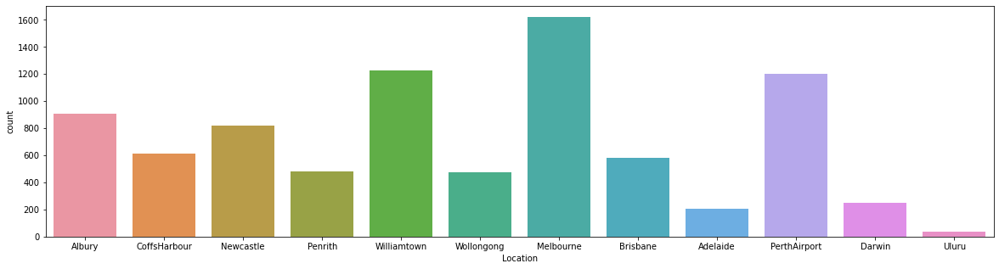

In [81]:
#Count Plot for "Location" column
print(df["Location"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("Location",data=df)

   'Melbourne' is the most common name of the location of the weather station and 'Uluru' is least

N      1704
SSE     578
S       577
SW      572
E       557
WNW     531
W       507
WSW     504
SE      484
ENE     415
SSW     396
NW      383
NE      353
NNE     343
ESE     302
NNW     219
Name: WindGustDir, dtype: int64


<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

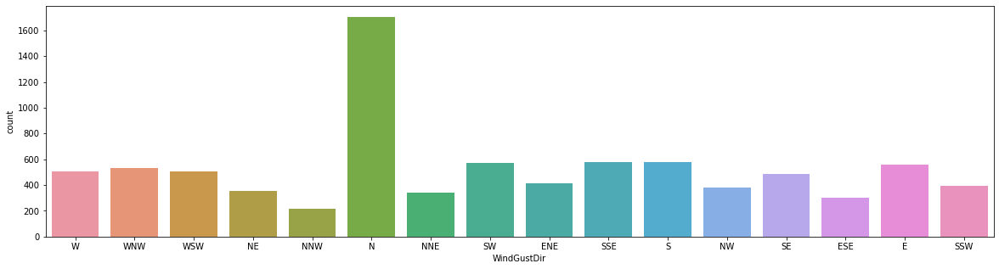

In [82]:
print(df["WindGustDir"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("WindGustDir",data=df)

In [83]:
#  The direction of the strongest wind gust in the 24 hours to midnight is in N most and in NNW least.

N      1735
SW      704
NW      625
WSW     543
SE      505
WNW     480
SSW     467
ENE     433
NNE     430
W       414
NE      409
S       402
E       380
SSE     365
NNW     280
ESE     253
Name: WindDir9am, dtype: int64


<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

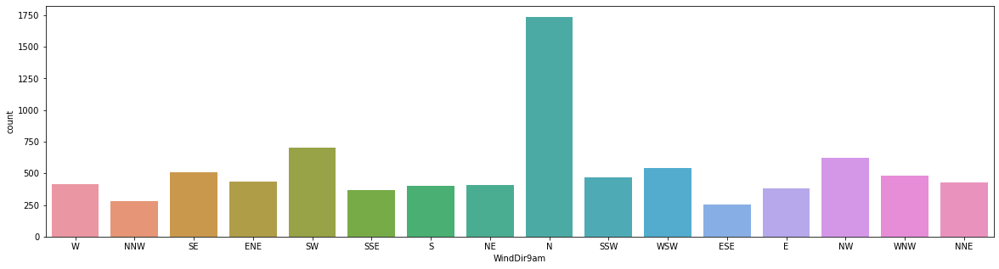

In [84]:
print(df["WindDir9am"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("WindDir9am",data=df)

In [85]:
#  Direction of the wind at 9am is also strong in N and least in NNW

SE     1121
S       742
SSE     623
WSW     580
NE      544
N       524
SW      494
WNW     487
NW      468
W       462
ESE     462
E       460
ENE     417
SSW     370
NNE     365
NNW     306
Name: WindDir3pm, dtype: int64


<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

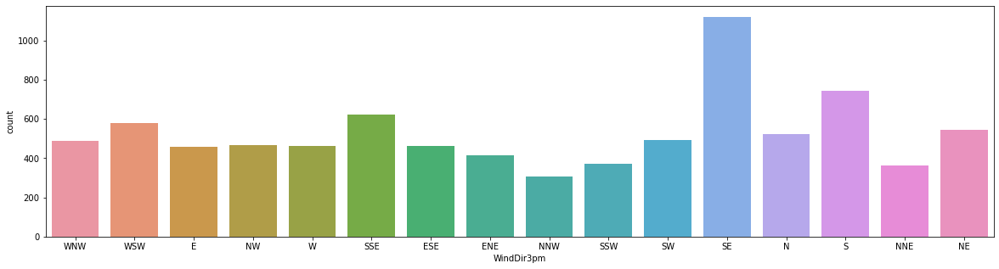

In [86]:
print(df["WindDir3pm"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("WindDir3pm",data=df)

In [87]:
#  Direction of the wind at 3pm is strong in S and least in NNW

No     6435
Yes    1990
Name: RainToday, dtype: int64


<AxesSubplot:xlabel='RainToday', ylabel='count'>

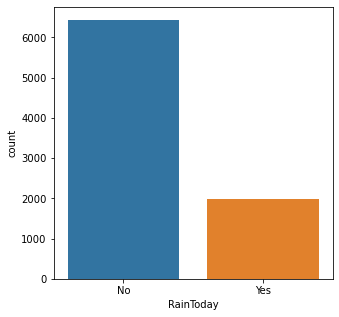

In [88]:
print(df["RainToday"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("RainToday",data=df)

In [89]:
#  No Rain Today is highest compare to RainToday

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

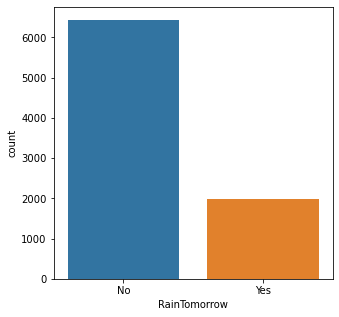

In [90]:
print(df["RainTomorrow"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("RainTomorrow",data=df)

######  No RainTomorrow is highest compare to RainTomorrow

Using Histplot for Continuous Column

 13.3    139
 12.0     74
 13.2     71
 13.8     69
 12.7     68
        ... 
 0.3       1
 28.3      1
-1.1       1
-1.4       1
 26.0      1
Name: MinTemp, Length: 285, dtype: int64


<AxesSubplot:xlabel='MinTemp', ylabel='Count'>

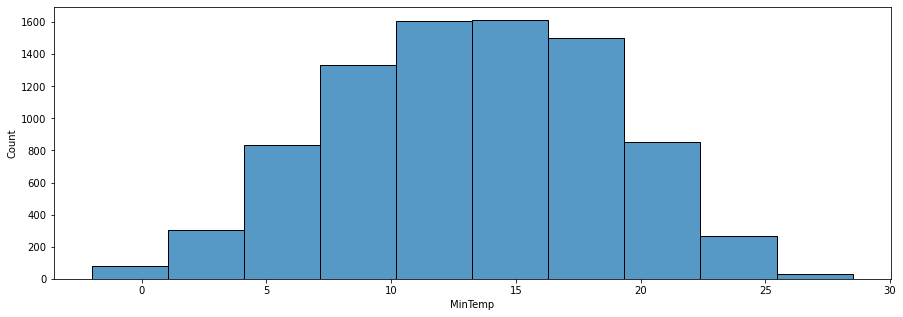

In [97]:
print(df["MinTemp"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='MinTemp',data=df,bins=10)

In [92]:
#  12.7 degrees celsius is the highest minimum temperature.

<AxesSubplot:xlabel='MaxTemp', ylabel='Count'>

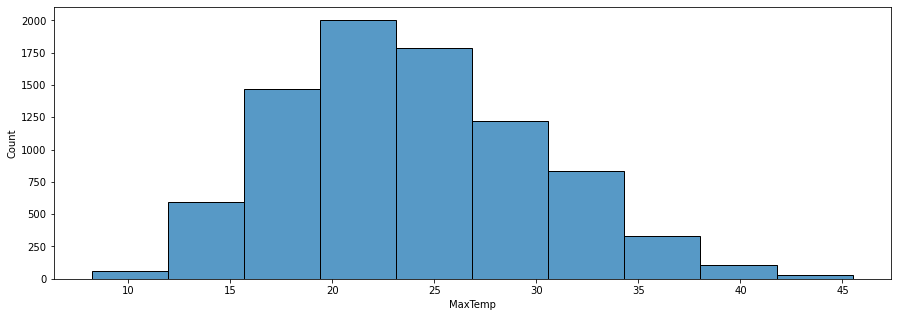

In [93]:
plt.figure(figsize=(15,5))
sns.histplot(x='MaxTemp',data=df,bins=10)


19.0 degrees celsius is the highest maximum temperature.

<AxesSubplot:xlabel='Rainfall', ylabel='Count'>

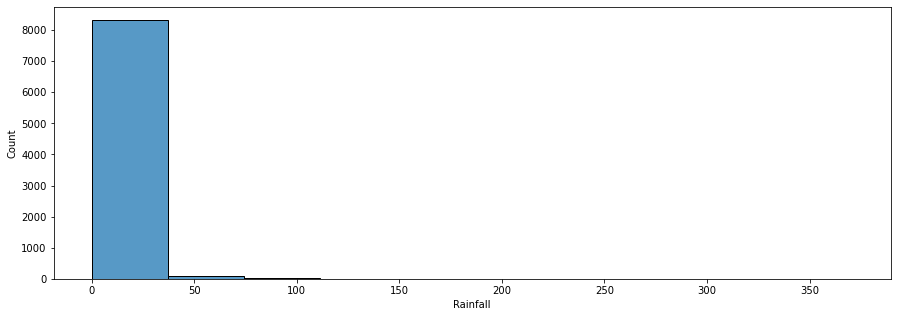

In [94]:
plt.figure(figsize=(15,5))
sns.histplot(x='Rainfall',data=df,bins=10)

In [95]:
#  0.0 mm rainfall is maximum rainfall recorded for the day.

4.0     305
3.0     283
2.2     259
2.6     250
2.4     246
       ... 
19.2      2
0.7       2
17.6      2
15.0      1
15.6      1
Name: Evaporation, Length: 116, dtype: int64


<AxesSubplot:xlabel='Evaporation', ylabel='Count'>

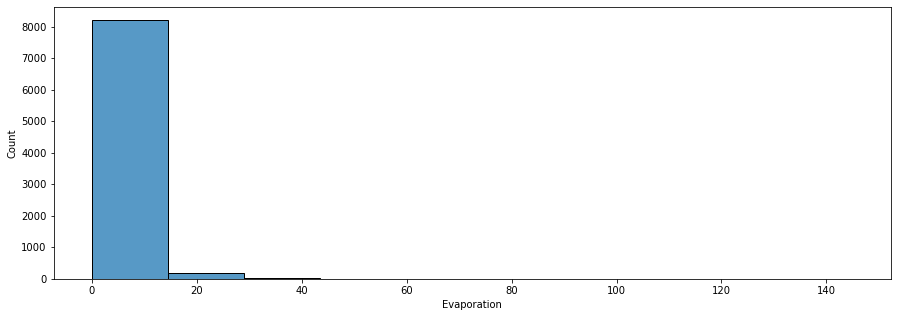

In [99]:
print(df["Evaporation"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Evaporation',data=df,bins=10)

In [100]:
# Maximum 4.0 mm Evaporation happens in the 24 hours to 9am

0.0     312
11.1    130
11.2    128
11.0    126
10.7    122
       ... 
2.5      15
13.6     14
13.8      8
13.9      6
13.5      4
Name: Sunshine, Length: 140, dtype: int64


<AxesSubplot:xlabel='Sunshine', ylabel='Count'>

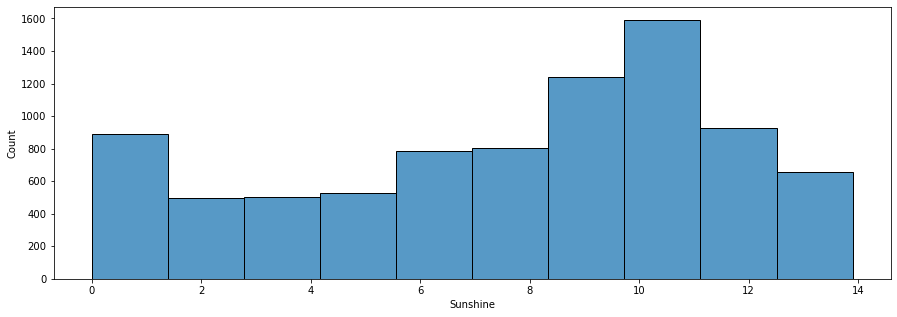

In [102]:
print(df["Sunshine"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Sunshine',data=df,bins=10)

In [103]:
#   0.00 hours is the highest bright sunshine in the day.

39.0     1432
35.0      435
37.0      422
33.0      408
31.0      396
41.0      371
30.0      367
28.0      332
43.0      302
48.0      292
26.0      275
50.0      259
46.0      258
24.0      255
52.0      249
44.0      241
22.0      223
54.0      210
20.0      186
56.0      153
57.0      148
19.0      137
61.0      114
59.0      113
63.0       95
17.0       92
65.0       74
67.0       64
72.0       62
15.0       58
13.0       57
74.0       54
70.0       53
69.0       49
76.0       44
78.0       23
80.0       22
11.0       18
85.0       14
81.0       13
91.0       12
93.0        7
89.0        7
83.0        6
9.0         6
98.0        4
94.0        3
87.0        3
7.0         2
102.0       2
100.0       2
107.0       1
Name: WindGustSpeed, dtype: int64


<AxesSubplot:xlabel='WindGustSpeed', ylabel='Count'>

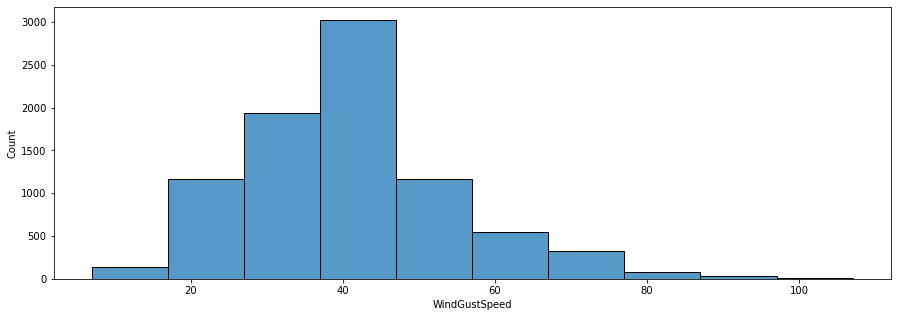

In [104]:
print(df["WindGustSpeed"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='WindGustSpeed',data=df,bins=10)

In [105]:
#   39.0(km/h) is the hoghest speed of the strongest wind gust in the 24 hours to midnight

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Count'>

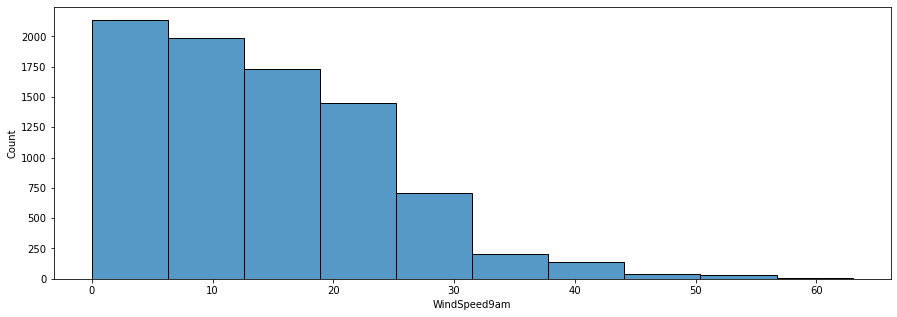

In [106]:
plt.figure(figsize=(15,5))
sns.histplot(x='WindSpeed9am',data=df,bins=10)

In [107]:
#  13.0(km/hr) is the highest Wind speed averaged over 10 minutes prior to 9am

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Count'>

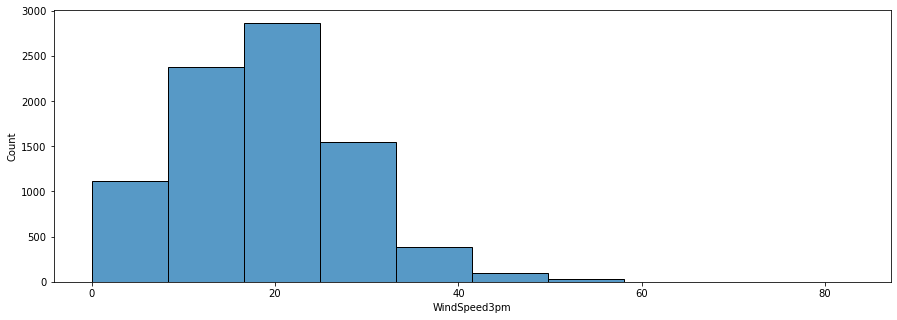

In [108]:
plt.figure(figsize=(15,5))
sns.histplot(x='WindSpeed3pm',data=df,bins=10)

In [109]:
#  20.0(km/hr) is the highest Wind speed averaged over 10 minutes prior to 3pm

<AxesSubplot:xlabel='Humidity9am', ylabel='Count'>

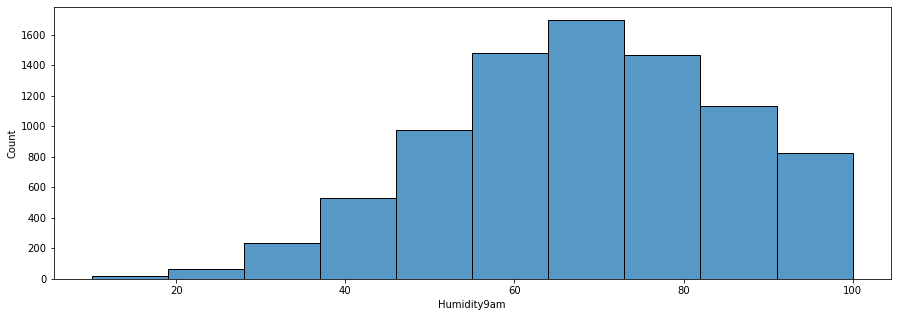

In [110]:
plt.figure(figsize=(15,5))
sns.histplot(x='Humidity9am',data=df,bins=10)

In [111]:
#  62.0(percent) is the highest Humidity at 9am

<AxesSubplot:xlabel='Humidity3pm', ylabel='Count'>

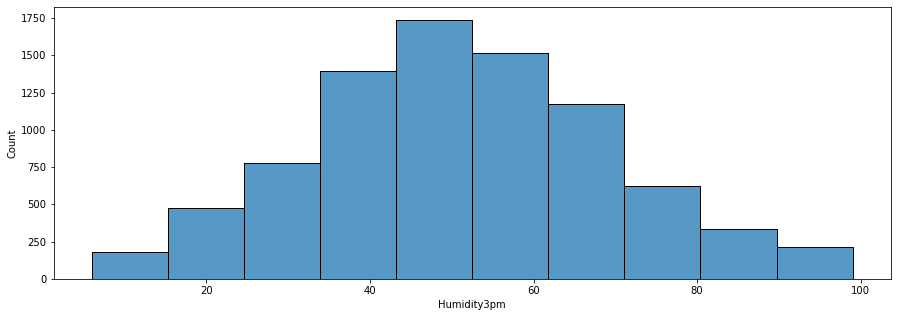

In [113]:
plt.figure(figsize=(15,5))
sns.histplot(x='Humidity3pm',data=df,bins=10)

In [114]:
#  49.0(percent) is the highest Humidity at 3pm

<AxesSubplot:xlabel='Pressure9am', ylabel='Count'>

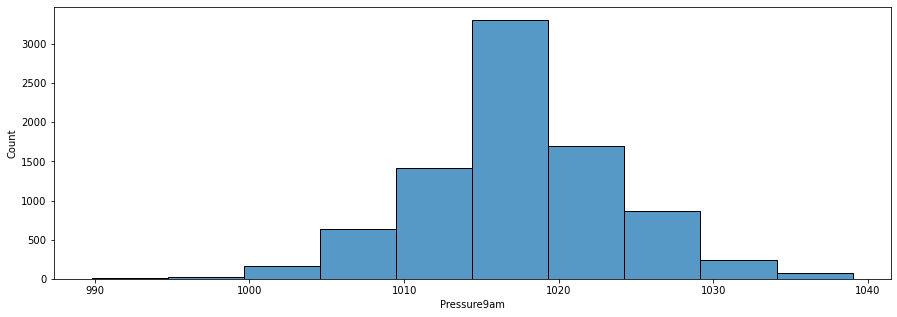

In [116]:
plt.figure(figsize=(15,5))
sns.histplot(x='Pressure9am',data=df,bins=10)

In [117]:
# 1014.8 (hpa) is the highest Atmospheric pressure reduced to mean sea level at 9am

<AxesSubplot:xlabel='Pressure3pm', ylabel='Count'>

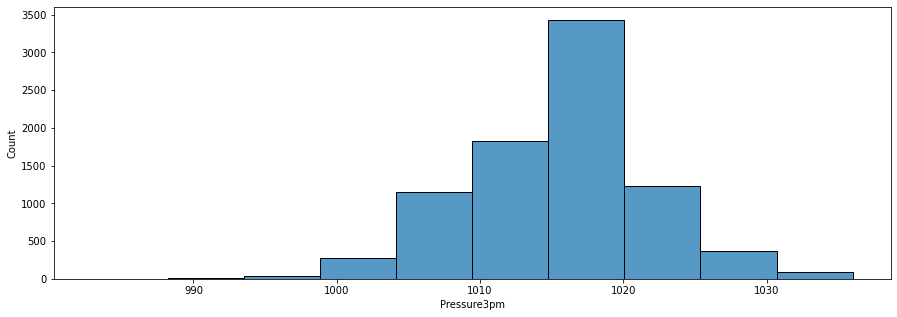

In [118]:
plt.figure(figsize=(15,5))
sns.histplot(x='Pressure3pm',data=df,bins=10)

In [119]:
#  1017.8 (hpa) is the highest Atmospheric pressure reduced to mean sea level at 3pm

<AxesSubplot:xlabel='Cloud9am', ylabel='Count'>

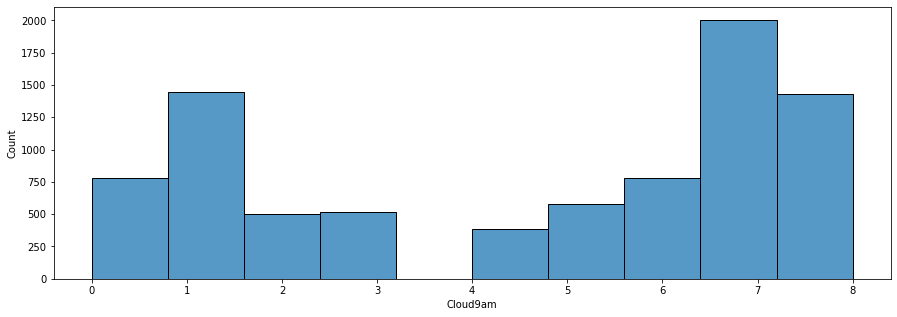

In [120]:
plt.figure(figsize=(15,5))
sns.histplot(x='Cloud9am',data=df,bins=10)

In [121]:
#  7.0 is the highest Fraction of sky obscured by cloud at 9am.

<AxesSubplot:xlabel='Cloud3pm', ylabel='Count'>

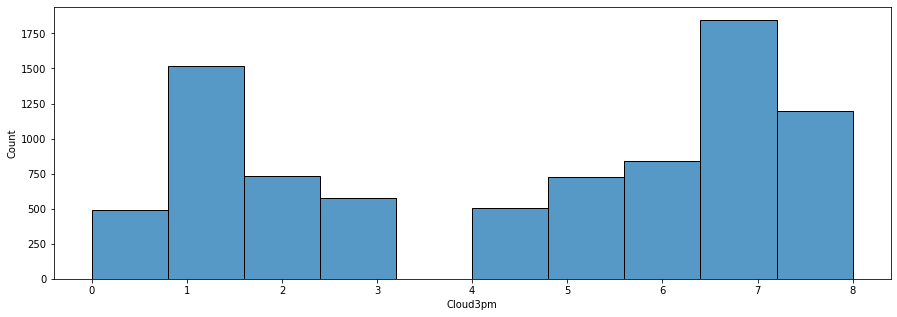

In [122]:
plt.figure(figsize=(15,5))
sns.histplot(x='Cloud3pm',data=df,bins=10)

In [123]:
# 7.0 is the highest Fraction of sky obscured by cloud at 3PM

<AxesSubplot:xlabel='Temp9am', ylabel='Count'>

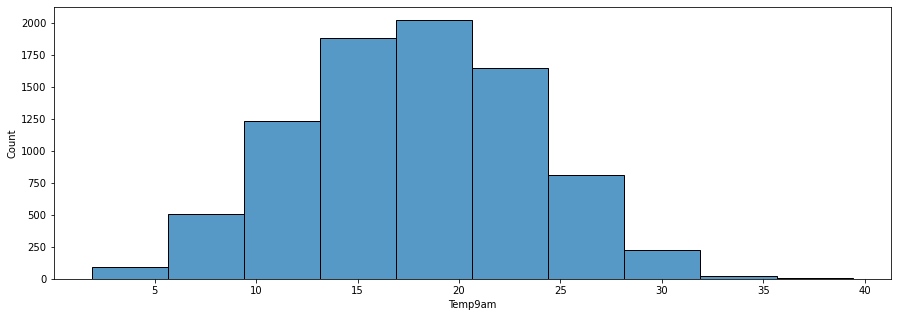

In [124]:
plt.figure(figsize=(15,5))
sns.histplot(x='Temp9am',data=df,bins=10)

In [125]:
#  14.8 (degrees C) is the highest Temperature at 9am

<AxesSubplot:xlabel='Temp3pm', ylabel='Count'>

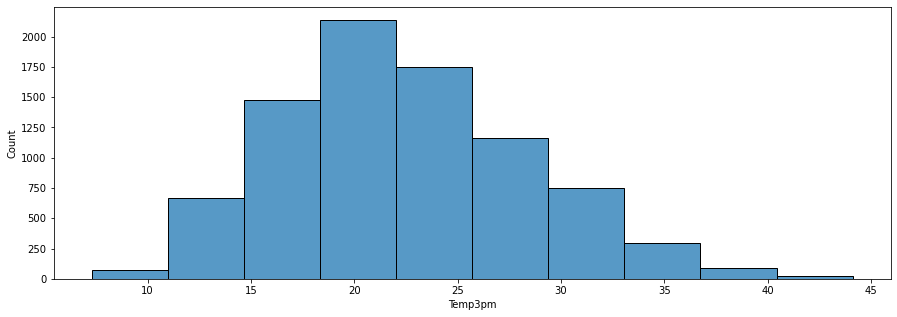

In [126]:
plt.figure(figsize=(15,5))
sns.histplot(x='Temp3pm',data=df,bins=10)

In [127]:
# 21.7 (degrees C) is the highest Temperature at 3pm

<AxesSubplot:xlabel='Day', ylabel='Count'>

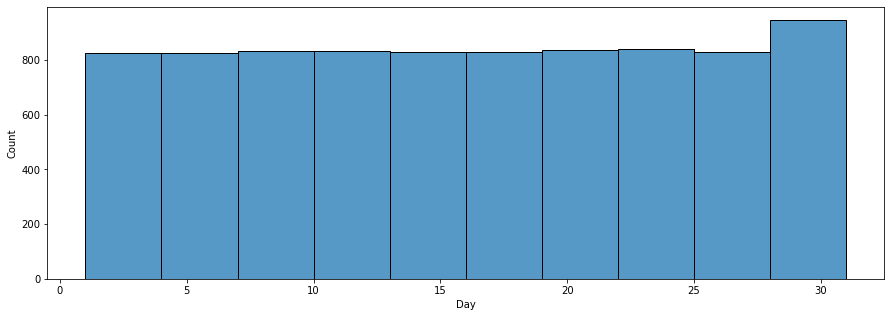

In [128]:
plt.figure(figsize=(15,5))
sns.histplot(x='Day',data=df,bins=10)

In [129]:
# Highest Observered on day 24

<AxesSubplot:xlabel='Month', ylabel='Count'>

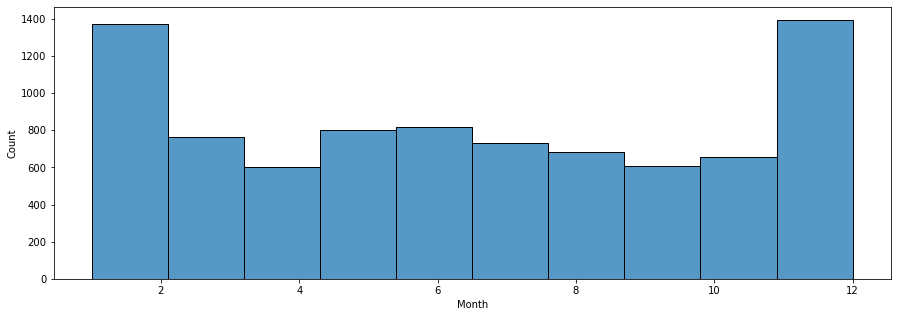

In [130]:
plt.figure(figsize=(15,5))
sns.histplot(x='Month',data=df,bins=10)

In [131]:
#Highest Observered in Month is 1st that is January


<AxesSubplot:xlabel='Year', ylabel='Count'>

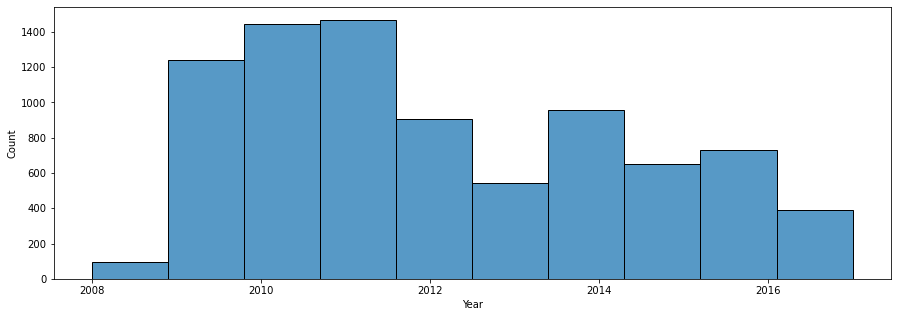

In [132]:
plt.figure(figsize=(15,5))
sns.histplot(x='Year',data=df,bins=10)

In [133]:
#  Highest Observered in Year 2010

In [134]:
#  Bivariate Analysis

<AxesSubplot:xlabel='Location', ylabel='Rainfall'>

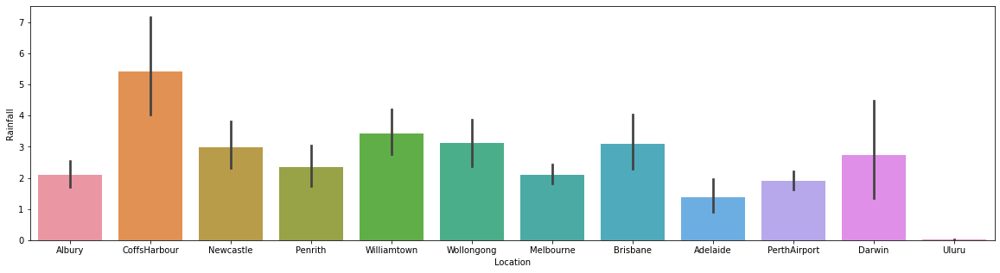

In [135]:
#Count Plot for comparision between "Location" column and "Rainfall" column
plt.figure(figsize=(20,5))
sns.barplot("Location",data=df, y='Rainfall')

In [136]:
#  'CoffsHarbour' is the location where Rainfall is most and No Rainfall in Uluru

<AxesSubplot:xlabel='Location', ylabel='count'>

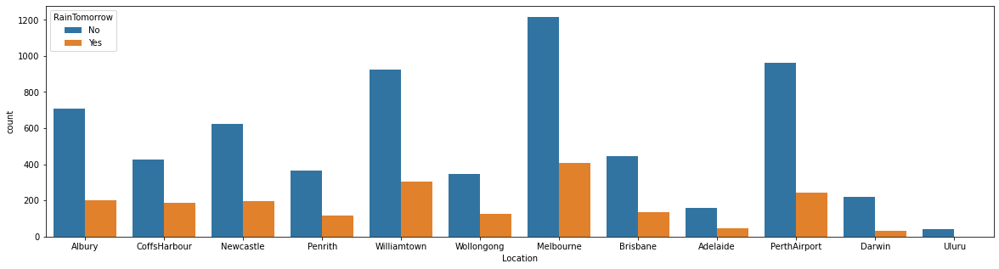

In [138]:
# Count Plot for comparision between "Location" column and "Rainfall" column
plt.figure(figsize=(20,5))
sns.countplot("Location",data=df, hue='RainTomorrow')

In [139]:
# No RainTomorrow is most in all location but 'Melbourne' Location is having highest among all location for No RainTomorrow.

<AxesSubplot:xlabel='Location', ylabel='Rainfall'>

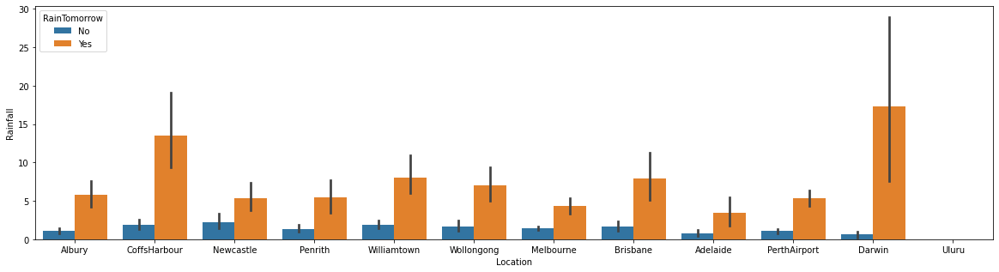

In [141]:
plt.figure(figsize=(20,5))
sns.barplot("Location",data=df, y='Rainfall', hue='RainTomorrow')

In [142]:
#  At 'Darwin' Location there is RainTomorrow having approx 20mm Rainfall and no prediction for Uluru whether it Rain Tommorow or not.

<AxesSubplot:xlabel='WindGustDir', ylabel='Rainfall'>

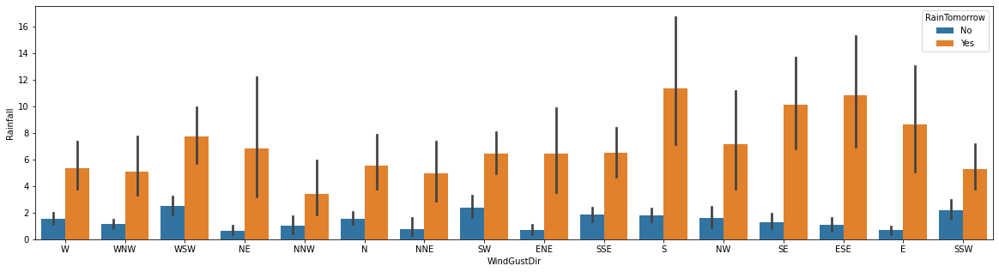

In [143]:
plt.figure(figsize=(20,5))
sns.barplot("WindGustDir",data=df, y='Rainfall', hue='RainTomorrow')

In [144]:
#  "ESE" and "S" WindGustDir is having highest RainTomorrow with approx 12.5mm Rainfall.

<AxesSubplot:xlabel='WindDir9am', ylabel='Rainfall'>

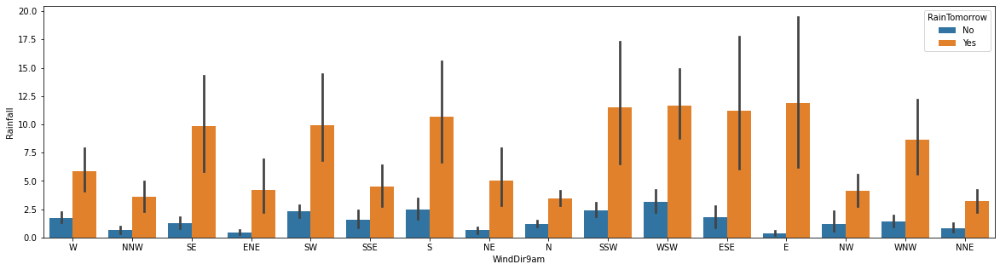

In [145]:
plt.figure(figsize=(20,5))
sns.barplot("WindDir9am",data=df, y='Rainfall', hue='RainTomorrow')

In [146]:
# There will be RainTomorrow in all wind direction at 9am having heavy Rainfall.

<AxesSubplot:xlabel='WindDir3pm', ylabel='Rainfall'>

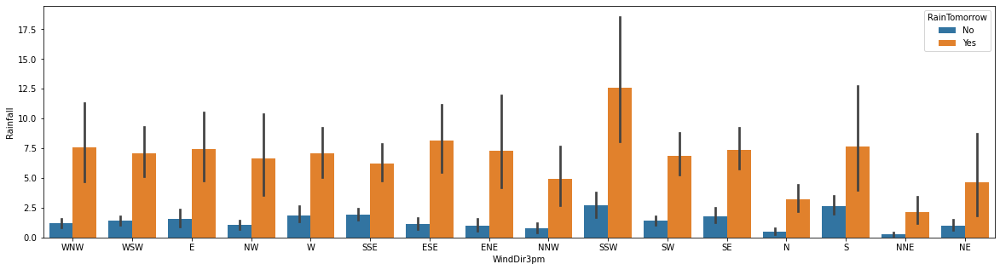

In [147]:
plt.figure(figsize=(20,5))
sns.barplot("WindDir3pm",data=df, y='Rainfall', hue='RainTomorrow')

In [148]:
#  There will be RainTomorrow in all wind direction at 3pm having heavy Rainfall.

<AxesSubplot:xlabel='MinTemp', ylabel='Rainfall'>

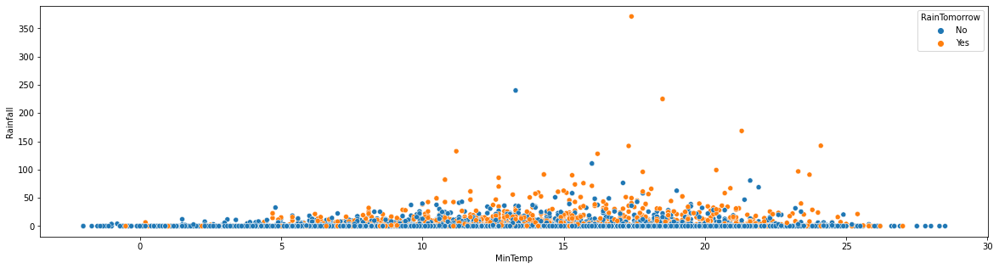

In [149]:
plt.figure(figsize=(20,5))
sns.scatterplot("MinTemp",data=df, y='Rainfall', hue='RainTomorrow')

Min Temperature 18 is having heavy Rainfall Tomorrow. With increase in Min Temperature, Rainfall amount is also increasing with highest possibily of having Rain Tomorrow.

<AxesSubplot:xlabel='MaxTemp', ylabel='Rainfall'>

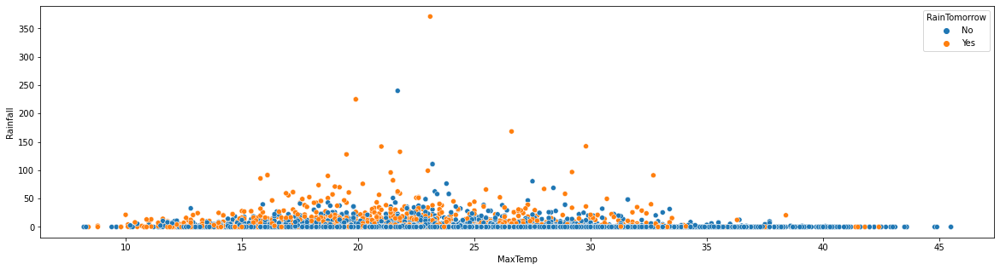

In [150]:
plt.figure(figsize=(20,5))
sns.scatterplot("MaxTemp",data=df, y='Rainfall', hue='RainTomorrow')

With increase in Max Temperature, Rainfall amount is decreasing and with less Max Temperatur highest possibily of having heavy Rain Tomorrow.

<AxesSubplot:xlabel='Evaporation', ylabel='Rainfall'>

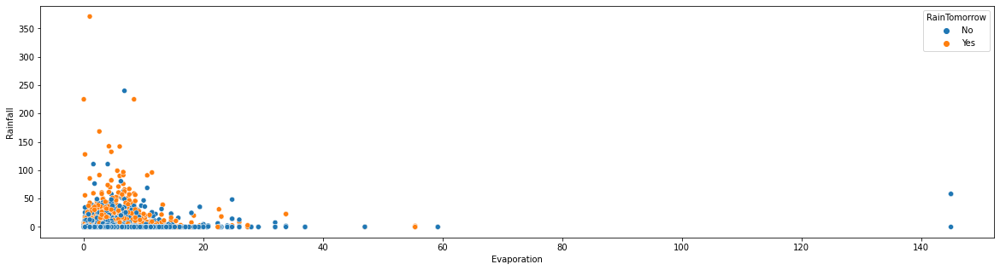

In [151]:
plt.figure(figsize=(20,5))
sns.scatterplot("Evaporation",data=df, y='Rainfall', hue='RainTomorrow')

In [152]:
# Less Evaporation heavy Rainfall Tomorrow, High Evaporation less or no Rainfall Tomorrow

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

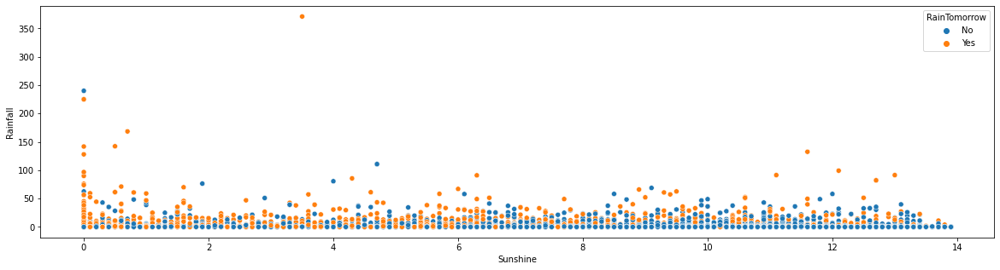

In [154]:
plt.figure(figsize=(20,5))
sns.scatterplot("Sunshine",data=df, y='Rainfall', hue='RainTomorrow')

In [155]:
# If Sunshine is less then Heavy Rainfall will be Tomorrow, and If Sunshine is hogh then less Rainfall will be Tomorrow.

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Rainfall'>

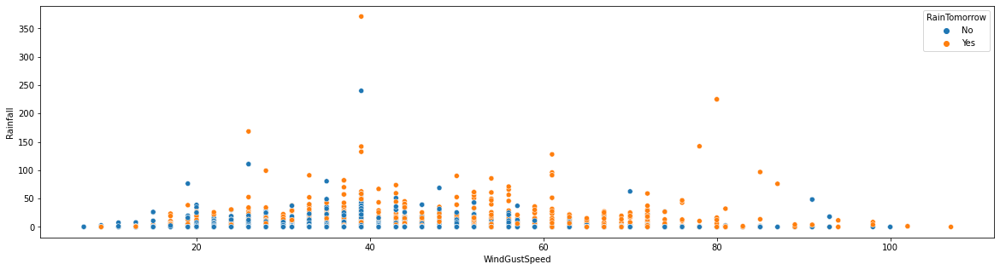

In [156]:
plt.figure(figsize=(20,5))
sns.scatterplot("WindGustSpeed",data=df, y='Rainfall', hue='RainTomorrow')

In [157]:
# High Wind Gust Speed, Heavy Rainfall Tomorrow and low Wind Gust Speed low Rainfall Tomorrow.

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Rainfall'>

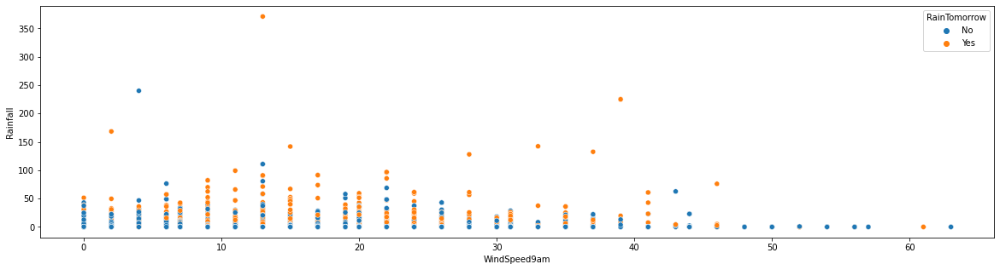

In [158]:
plt.figure(figsize=(20,5))
sns.scatterplot("WindSpeed9am",data=df, y='Rainfall', hue='RainTomorrow')

In [159]:
# At 9AM low Wind Speed Heavy Rainfall, as Wind Speed increases Rainfall decreases Tomorrow.

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Rainfall'>

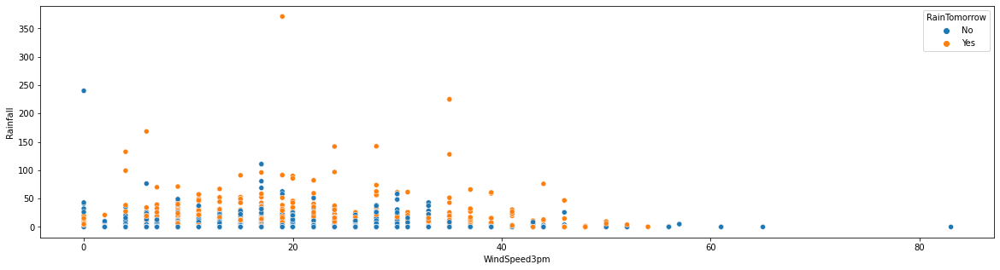

In [160]:
plt.figure(figsize=(20,5))
sns.scatterplot("WindSpeed3pm",data=df, y='Rainfall', hue='RainTomorrow')

At 3 PM low Wind Speed Heavy Rainfall, as Wind Speed increases Rainfall decreases Tomorrow.

<AxesSubplot:xlabel='Humidity9am', ylabel='Rainfall'>

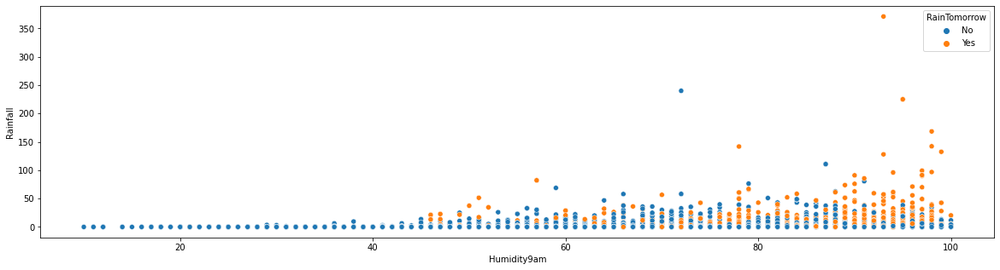

In [161]:
plt.figure(figsize=(20,5))
sns.scatterplot("Humidity9am",data=df, y='Rainfall', hue='RainTomorrow')

At 9 AM, as humidity increases Rainfall will increase Tomorrow. Low Humidity No Rainfall, High Humidity Heavy Rainfall

<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

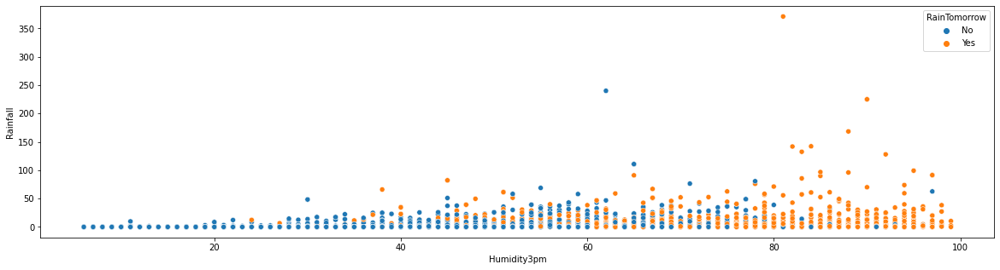

In [162]:
plt.figure(figsize=(20,5))
sns.scatterplot("Humidity3pm",data=df, y='Rainfall', hue='RainTomorrow')

In [163]:
# At 3 PM, as humidity increases Rainfall will increase Tomorrow. Low Humidity No Rainfall, High Humidity Heavy Rainfall

<AxesSubplot:xlabel='Pressure9am', ylabel='Rainfall'>

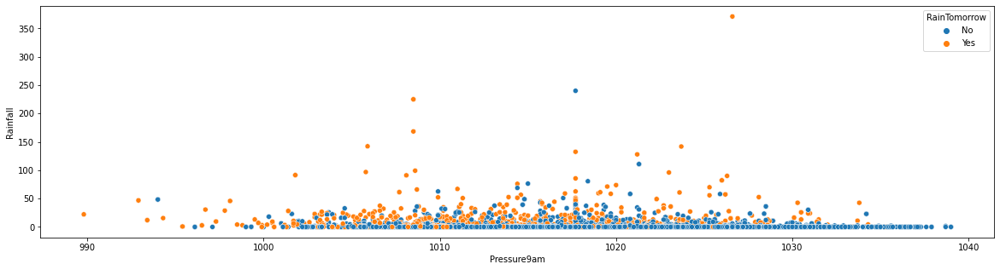

In [164]:
plt.figure(figsize=(20,5))
sns.scatterplot("Pressure9am",data=df, y='Rainfall', hue='RainTomorrow')

In [165]:
# At 9 AM there will be Heavy Rainfall Tomorrow

<AxesSubplot:xlabel='Pressure3pm', ylabel='Rainfall'>

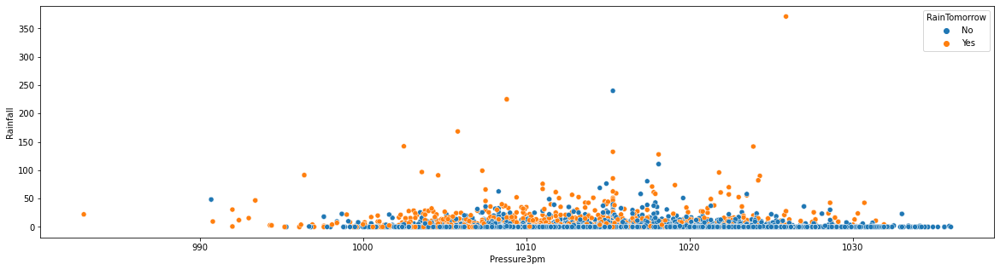

In [166]:
plt.figure(figsize=(20,5))
sns.scatterplot("Pressure3pm",data=df, y='Rainfall', hue='RainTomorrow')

In [167]:
# At 3PM there will be Heavy Rainfall Tomorrow

<AxesSubplot:xlabel='Cloud9am', ylabel='Rainfall'>

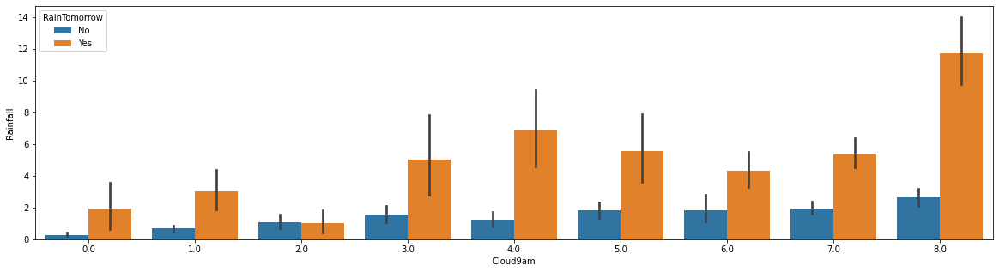

In [168]:
plt.figure(figsize=(20,5))
sns.barplot("Cloud9am",data=df, y='Rainfall', hue='RainTomorrow')

In [169]:
# At 9 AM there will be Heavy Rainfall Tomorrow

<AxesSubplot:xlabel='Cloud3pm', ylabel='Rainfall'>

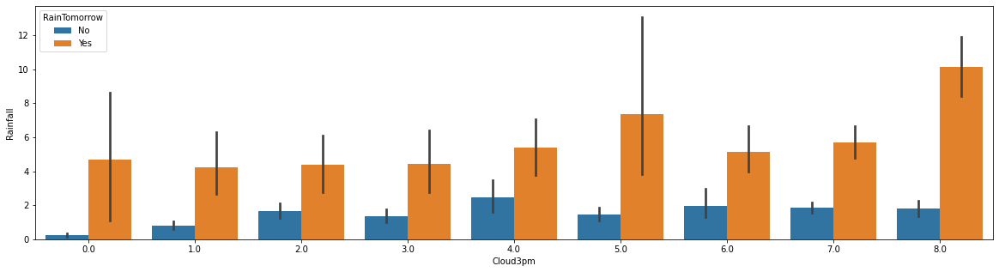

In [170]:
plt.figure(figsize=(20,5))
sns.barplot("Cloud3pm",data=df, y='Rainfall', hue='RainTomorrow')

In [171]:
# At 3 PM there will be Heavy Rainfall Tomorrow

<AxesSubplot:xlabel='Temp9am', ylabel='Rainfall'>

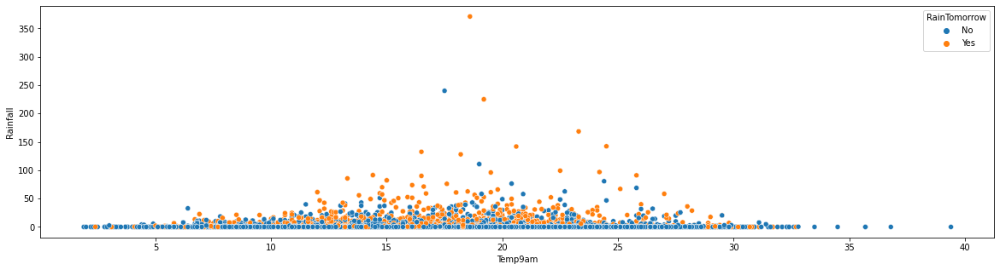

In [172]:
plt.figure(figsize=(20,5))
sns.scatterplot("Temp9am",data=df, y='Rainfall', hue='RainTomorrow')

In [173]:
# In between Temperature 5 to 30 at 9AM there will be heavy Rainfall Tomorrow.

<AxesSubplot:xlabel='Temp3pm', ylabel='Rainfall'>

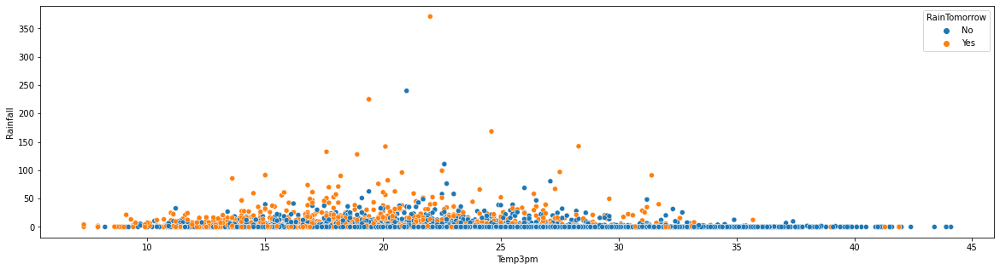

In [174]:
plt.figure(figsize=(20,5))
sns.scatterplot("Temp3pm",data=df, y='Rainfall', hue='RainTomorrow')

At low Temperature Heavy Rainfall will be Tomorrow but with Increased Temperature there will be No Rain Tomorrow at 3PM

<AxesSubplot:xlabel='RainToday', ylabel='Rainfall'>

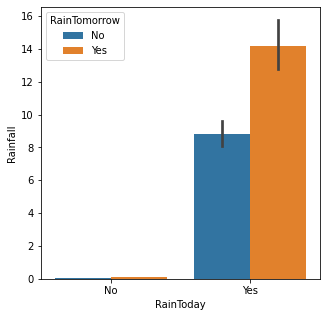

In [175]:
plt.figure(figsize=(5,5))
sns.barplot("RainToday",data=df, y='Rainfall', hue='RainTomorrow')

In [176]:
# Today is also Rainining heavily and will also Tomorrow.

Multivariate Analysis
Using Pairplot

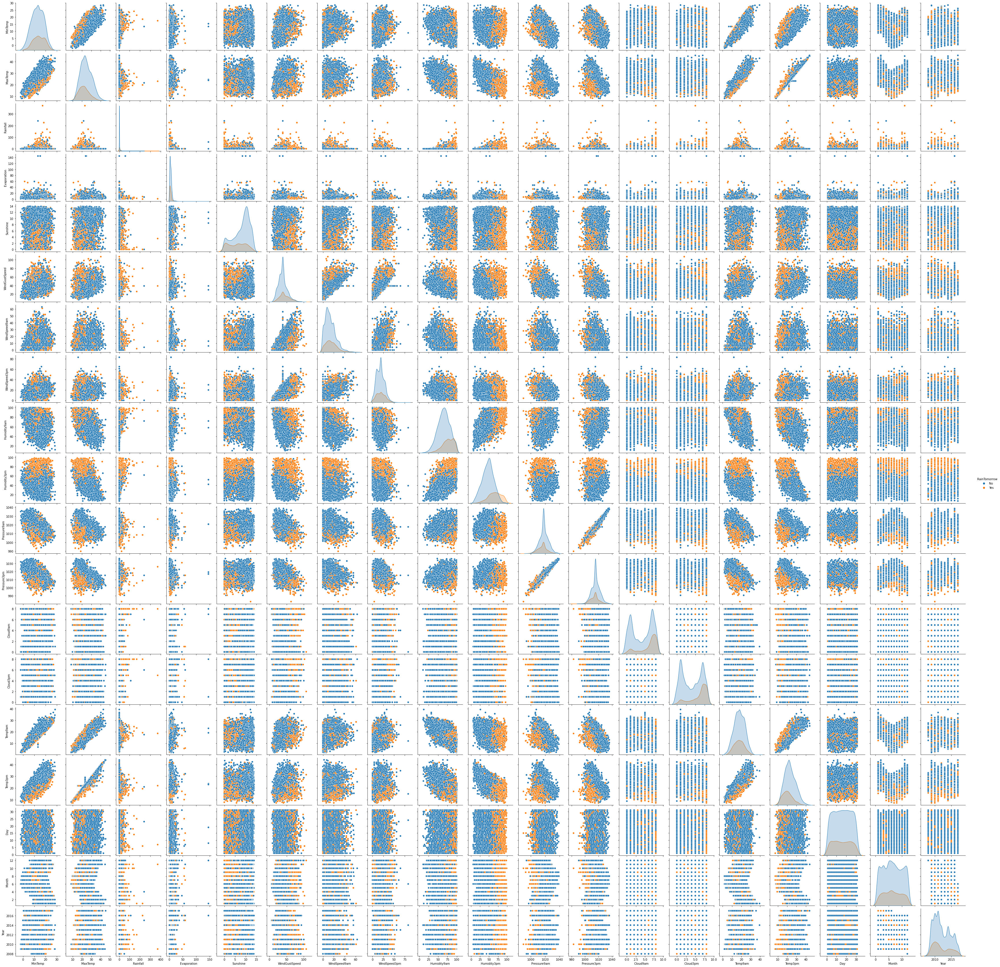

In [177]:
sns.pairplot(df,hue="RainTomorrow")

In [178]:
#   We can observe relationship between all the continuous column and the target column by this pairplot in pairs which are plotted on basis of target column "RainTomorrow".

# Label Encoding

In [179]:
enc = LabelEncoder()
for i in df.columns:
    if df[i].dtypes=="object":
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [180]:
df.dtypes

Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
Day                int64
Month              int64
Year               int64
dtype: object

In [181]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


# Checking Correlation

In [182]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.116555,0.064220,0.005801,0.112136,0.051015,-0.035408,0.230018,-0.027103,-0.027736,0.221035,0.231897,0.005680,0.055767,-0.031990,-0.020292,0.031027,0.019062,0.118062,0.060441,0.003071,0.002824,-0.002019,-0.082407,0.486405
MinTemp,0.116555,1.000000,0.717522,0.085765,0.189110,0.052745,-0.145446,0.230200,-0.041781,-0.147147,0.136643,0.178137,-0.130711,0.079143,-0.429683,-0.423261,0.074114,0.039291,0.887111,0.685859,0.064752,0.092965,0.009448,-0.245872,0.044200
MaxTemp,0.064220,0.717522,1.000000,-0.087595,0.243441,0.269371,-0.224078,0.139909,-0.213776,-0.180689,0.013444,0.088300,-0.391081,-0.421952,-0.325758,-0.403283,-0.216731,-0.210380,0.866085,0.974690,-0.224693,-0.152672,0.015662,-0.163056,0.119461
Rainfall,0.005801,0.085765,-0.087595,1.000000,0.013209,-0.117082,0.037106,0.082628,0.093072,0.038153,0.048726,0.021594,0.227587,0.234955,-0.069595,-0.031261,0.155825,0.125417,-0.007356,-0.090649,0.464941,0.219015,-0.013029,-0.016258,0.004491
Evaporation,0.112136,0.189110,0.243441,0.013209,1.000000,0.143117,-0.055673,0.110523,-0.056374,-0.041282,0.082081,0.080617,-0.163797,-0.124277,-0.140668,-0.153593,-0.034368,-0.072635,0.230373,0.236716,-0.070088,-0.051705,0.002280,-0.006442,0.115883
Sunshine,0.051015,0.052745,0.269371,-0.117082,0.143117,1.000000,-0.073721,-0.007628,-0.055684,-0.050371,-0.000620,0.025273,-0.256352,-0.307962,0.009256,-0.031698,-0.329071,-0.316385,0.184779,0.282476,-0.160716,-0.233448,-0.003283,-0.008203,0.065822
WindGustDir,-0.035408,-0.145446,-0.224078,0.037106,-0.055673,-0.073721,1.000000,0.025577,0.403562,0.505799,0.025910,0.094114,0.036413,0.053712,-0.110491,-0.025847,0.108781,0.081204,-0.176350,-0.237932,0.125188,0.051832,0.015683,0.034823,-0.088340
WindGustSpeed,0.230018,0.230200,0.139909,0.082628,0.110523,-0.007628,0.025577,1.000000,-0.068545,0.070677,0.606090,0.639042,-0.271865,-0.093637,-0.407139,-0.372553,0.016892,0.073714,0.202275,0.102066,0.076890,0.190274,-0.002454,0.051063,-0.049612
WindDir9am,-0.027103,-0.041781,-0.213776,0.093072,-0.056374,-0.055684,0.403562,-0.068545,1.000000,0.249527,0.054972,0.046787,0.025540,0.124647,-0.011488,0.072945,0.084988,0.066660,-0.103150,-0.221064,0.157324,0.032860,-0.015154,0.012544,-0.014498
WindDir3pm,-0.027736,-0.147147,-0.180689,0.038153,-0.041282,-0.050371,0.505799,0.070677,0.249527,1.000000,0.025956,0.068961,-0.010303,-0.012211,-0.136493,-0.043655,0.063970,0.052899,-0.165066,-0.194762,0.100125,0.008918,0.003089,0.029384,-0.005812


In [183]:
# This gives the correlation between the denpendent and independent variables.

In [184]:
df.corr()["Rainfall"].sort_values()

Sunshine        -0.117082
Temp3pm         -0.090649
MaxTemp         -0.087595
Pressure9am     -0.069595
Pressure3pm     -0.031261
Month           -0.016258
Day             -0.013029
Temp9am         -0.007356
Year             0.004491
Location         0.005801
Evaporation      0.013209
WindSpeed3pm     0.021594
WindGustDir      0.037106
WindDir3pm       0.038153
WindSpeed9am     0.048726
WindGustSpeed    0.082628
MinTemp          0.085765
WindDir9am       0.093072
Cloud3pm         0.125417
Cloud9am         0.155825
RainTomorrow     0.219015
Humidity9am      0.227587
Humidity3pm      0.234955
RainToday        0.464941
Rainfall         1.000000
Name: Rainfall, dtype: float64

#### We can observe:
All columns are sorted in ascending order showing least to strong correlation with target column.
9 columns are negatively correlated and 15 columns are positively correlated.
Column "RainToday" is highly positively correlated with Target column "Rainfall" and column "Sunshine" is highly negatively correlated

In [185]:
df.corr()["RainTomorrow"].sort_values()

Sunshine        -0.233448
Temp3pm         -0.193625
Pressure9am     -0.163972
MaxTemp         -0.152672
Pressure3pm     -0.135227
Evaporation     -0.051705
Temp9am         -0.023206
Day             -0.015461
Year            -0.011066
Month           -0.001243
Location         0.002824
WindDir3pm       0.008918
WindDir9am       0.032860
WindGustDir      0.051832
WindSpeed3pm     0.053456
WindSpeed9am     0.068235
MinTemp          0.092965
WindGustSpeed    0.190274
Rainfall         0.219015
Cloud9am         0.239113
Humidity9am      0.271231
Cloud3pm         0.286989
RainToday        0.312929
Humidity3pm      0.444830
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

We can observe:
All columns are sorted in ascending order showing least to strong correlation with target column.
9 columns are negatively correlated and 15 columns are positively correlated.
Column "Humidity3pm" is highly positively correlated with Target column "RainTomorrow" and column "Sunshine" is highly negatively correlated

In [186]:
# Checking correlation with heatmap

<AxesSubplot:>

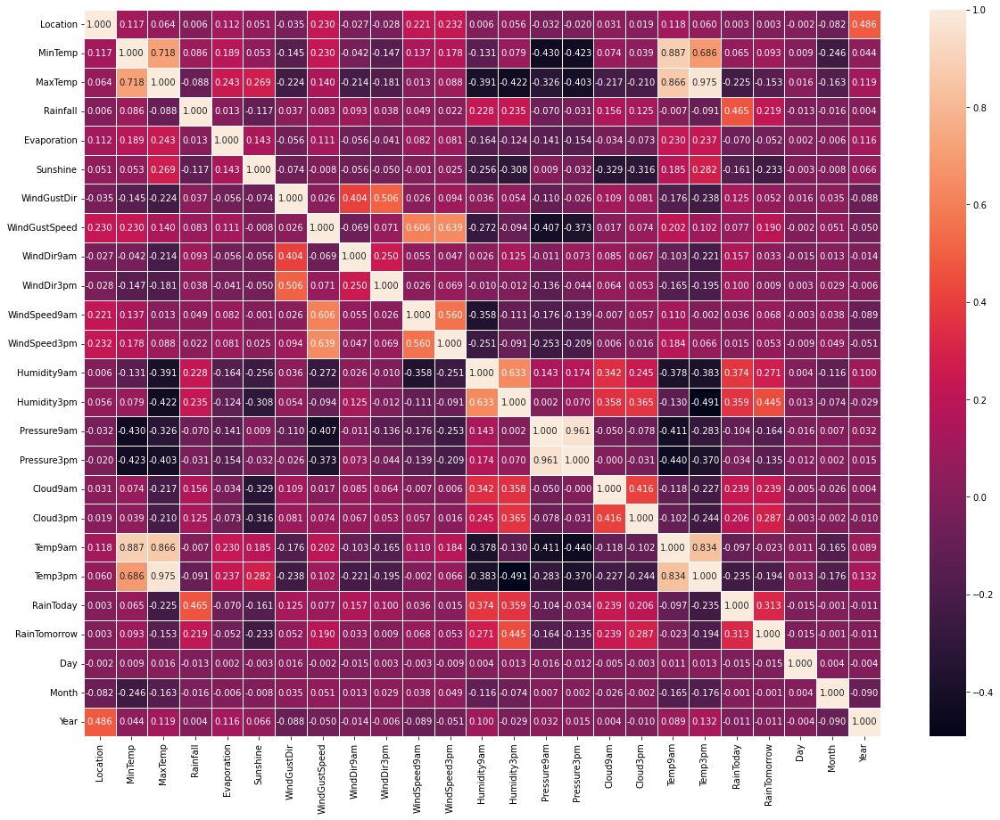

In [187]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),annot=True, linewidth=0.5, linecolor='white', fmt='.3f')

# Outcome of Correlation for Target Variable Rainfall

Location has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

MinTemp has 8 percent correlation with the target column which can be considered as good correlation and positively correlated.

MaxTemp has -11 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Evaporation has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Sunshine has -16 percent correlation with the target column which can be considered as weak correlation and negatively correlated.

WindGustDir has 6 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindGustSpeed has 10 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindDir9am has 11 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindDir3pm has 5 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindSpeed9am has 6 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindSpeed3pm has 4 percent correlation with the target column which can be considered as good correlation and positively correlated.

Humidity9am has 28 percent correlation with the target column which can be considered as good correlation and positively correlated.

Humidity3pm has 26 percent correlation with the target column which can be considered as good correlation and positively correlated.

Pressure9am has -10 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Pressure3pm has -5 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Cloud9am has 18 percent correlation with the target column which can be considered as good correlation and positively correlated.

Cloud3pm has 15 percent correlation with the target column which can be considered as good correlation and positively correlated.

Temp9am has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Temp3pm has -11 percent correlation with the target column which can be considered as good correlation and negatively correlated.

RainToday has 50 percent correlation with the target column which can be considered as strong correlation and positively correlated.

RainTomorrow has 26 percent correlation with the target column which can be considered as good correlation and positively correlated.

Day has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.


Month has -2 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Year has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

Max correlation is with RainToday

Min correlation is with Sunshine

# Outcome of Correlation for Target Variable RainTomorrow

Location has 0 percent correlation with the target column which can be considered as good correlation and positively correlated.

MinTemp has 7 percent correlation with the target column which can be considered as good correlation and positively correlated.

MaxTemp has -19 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Rainfall has -26 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Evaporation has -7 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Sunshine has -30 percent correlation with the target column which can be considered as weak correlation and negatively correlated.

WindGustDir has 6 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindGustSpeed has 21 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindDir9am has 3 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindDir3pm has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindSpeed9am has 8 percent correlation with the target column which can be considered as good correlation and positively correlated.

WindSpeed3pm has 8 percent correlation with the target column which can be considered as strong correlation and positively correlated.

Humidity9am has 31 percent correlation with the target column which can be considered as good correlation and positively correlated.

Humidity3pm has 47 percent correlation with the target column which can be considered as good correlation and positively correlated.

Pressure9am has -18 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Pressure3pm has -15 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Cloud9am has 26 percent correlation with the target column which can be considered as good correlation and positively correlated.

Cloud3pm has 33 percent correlation with the target column which can be considered as good correlation and positively correlated.

Temp9am has -6 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Temp3pm has -23 percent correlation with the target column which can be considered as good correlation and negatively correlated.

RainToday has 34 percent correlation with the target column which can be considered as good correlation and positively correlated.

RainTomorrow has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

Day has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Month has 2 percent correlation with the target column which can be considered as good correlation and positively correlated.

Year has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.

Max correlation is with Humidity3pm

Min correlation is with Sunshine

#### Checking correlation with barplot for Target Variable "Rainfall"

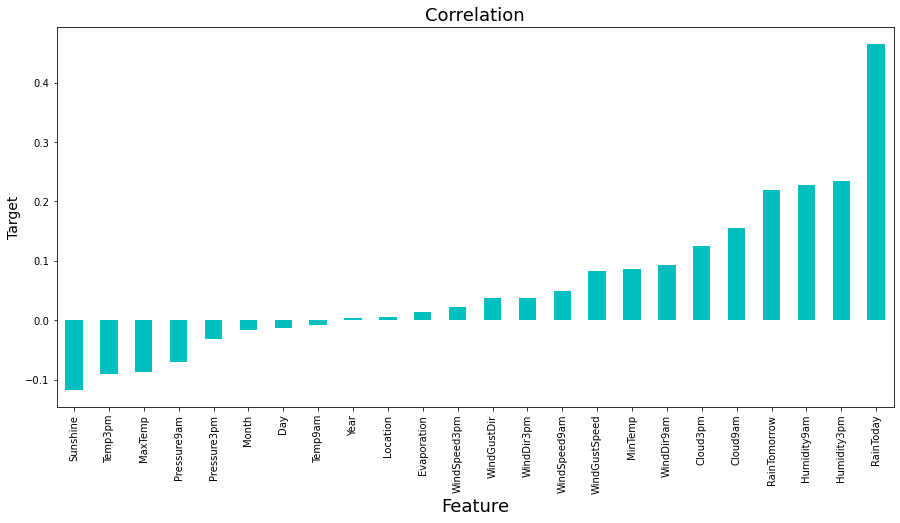

In [188]:
plt.figure(figsize=(15,7))
df.corr()['Rainfall'].sort_values(ascending=True).drop(['Rainfall']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=18)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

### Observation:
RainToday the highest positive correlation with Target column 'Rainfall' and Sunshine have the highest negative correlation with Target column 'Rainfall'.
Least correlation with Location column

#  Checking correlation with barplot for Target Variable "RainTomorrow"

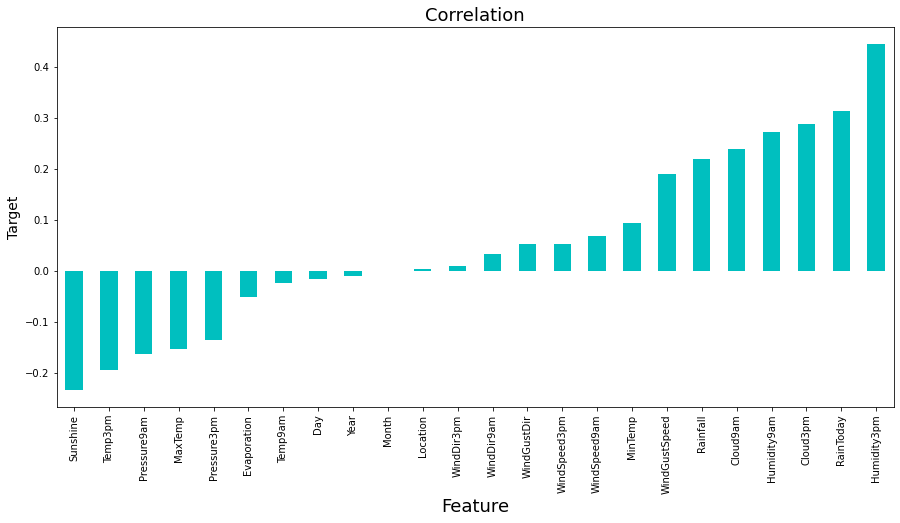

In [189]:
plt.figure(figsize=(15,7))
df.corr()['RainTomorrow'].sort_values(ascending=True).drop(['RainTomorrow']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=18)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

#  Observation:
Humidity3pm is the highest positive correlation with Target column 'RainTomorrow' and Sunshine have the highest negative correlation with Target column 'RainTomorrow'.
No Correlation with Location. So we will drop this column.

In [190]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [191]:
#  Checking Outliers

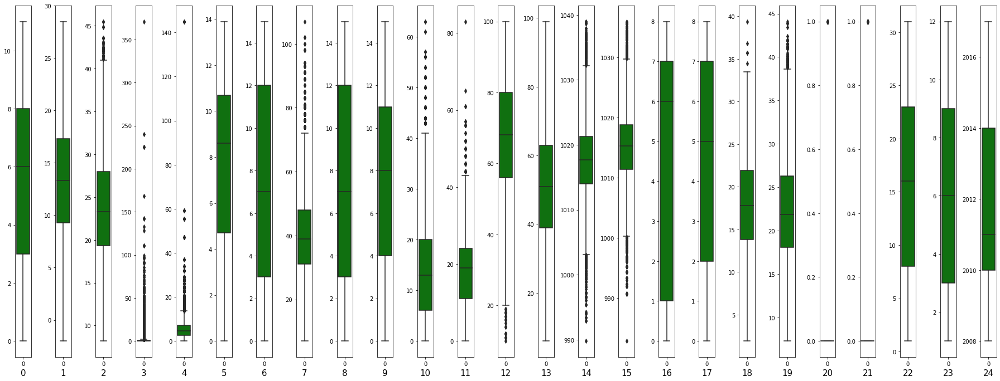

In [192]:
collist=df.columns.values
ncol=25
nrows=8
plt.figure(figsize=(ncol,3*ncol))
for column in range(0,len(collist)):
    plt.subplot(nrows,ncol,column+1)
    sns.boxplot(data=df[collist[column]],color='green',orient='v')
    plt.xlabel(column,fontsize = 15)
    plt.tight_layout()

Outcome:
Outliers Present in columns: 'MaxTemp', 'Rainfall', 'Evaporation', 'WindGustSpeed','WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm', 'RainToday', 'RainTomorrow'
Outliers not Present in columns: 'Location', 'MinTemp', 'Sunshine','WindGustDir', 'WindDir9am', 'WindDir3pm','Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Day', 'Month', 'Year'

Removing Outliers
1.1 Zscore method using Scipy for Target Column "Rainfall"¶

In [194]:
#  Outliers will be removed only from Continuous column i.e; MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm'
# We will not remove outliers from Target column i.e; 'Rainfall' and from categorical column : 'RainToday', 'RainTomorrow'

variable = df[['MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm']]

z=np.abs(zscore(variable))

# Creating new dataframe
df_forecast = df[(z<3).all(axis=1)]
df_forecast.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


In [195]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("New DataFrame data in Rows and Column:",df_forecast.shape)
print("Total Dropped rows:",df.shape[0]-df_forecast.shape[0])

Old DataFrame data in Rows and Column: (8425, 25)
New DataFrame data in Rows and Column: (8075, 25)
Total Dropped rows: 350


In [196]:
# Percentage Data Loss using Zscore

In [197]:
loss_percent=(6332-6069)/6332*100
print(loss_percent,"%")

4.153506001263424 %


# 1.2. IQR (Inter Quantile Range) method

In [198]:
#1st quantile
Q1=variable.quantile(0.25)

# 3rd quantile
Q3=variable.quantile(0.75)

#IQR
IQR=Q3 - Q1
df_forecasting=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [199]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",df_forecasting.shape)
print("\nTotal Dropped rows:",df.shape[0]-df_forecasting.shape[0])

Old DataFrame data in Rows and Column: (8425, 25)

New DataFrame data in Rows and Column: (7568, 25)

Total Dropped rows: 857


In [200]:
loss_perc = (6332-5743)/6332*100
loss_perc

9.301958307012002

We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method.

# 2.1 Zscore method using Scipy for Target Column "RainTomorrow"

In [201]:
#  Outliers will be removed only from Continuous column i.e; 'Rainfall', MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm'
# We will not remove outliers from Target column i.e; 'RainTomorrow' and from categorical column : 'RainToday'

variables = df[['Rainfall', 'MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm']]

z1=np.abs(zscore(variables))

# Creating new dataframe
df_forecast1 = df[(z1<3).all(axis=1)]
df_forecast1.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


In [202]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("New DataFrame data in Rows and Column:",df_forecast1.shape)
print("Total Dropped rows:",df.shape[0]-df_forecast1.shape[0])

Old DataFrame data in Rows and Column: (8425, 25)
New DataFrame data in Rows and Column: (7965, 25)
Total Dropped rows: 460


In [203]:
# Percentage Data Loss using Zscore

In [204]:
loss_percent1=(6332-5972)/6332*100
print(loss_percent1,"%")

5.685407454200885 %


# 2.2. IQR (Inter Quantile Range) method

In [205]:
#1st quantile
Q1=variable.quantile(0.25)

# 3rd quantile
Q3=variable.quantile(0.75)

#IQR
IQR=Q3 - Q1
df_forecasting1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [206]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",df_forecasting1.shape)
print("\nTotal Dropped rows:",df.shape[0]-df_forecasting1.shape[0])

Old DataFrame data in Rows and Column: (8425, 25)

New DataFrame data in Rows and Column: (7568, 25)

Total Dropped rows: 857


In [207]:
#  Percentage Data Loss using IQR

loss_perc = (6332-5743)/6332*100
loss_perc

9.301958307012002

In [208]:
# We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method

Now we have 2 Dataset for Target Column. So now we will drop column Location which have no relation with target Column 
'RainTomorrow' from Dataset "weather_forecast1"

In [209]:
df_forecast1=df_forecast1.drop(columns="Location", axis=1)

In [210]:
df_forecast1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


In [211]:
df_forecast1.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [212]:
df_forecast1.shape

(7965, 24)

In [213]:
#  1.1 Checking Skewness for 'Rainfall' Target column

In [214]:
#for Target variable 'Rainfall'
df_forecast.skew()

Location         -0.037561
MinTemp          -0.093740
MaxTemp           0.324194
Rainfall         13.813712
Evaporation       1.076644
Sunshine         -0.519362
WindGustDir       0.108185
WindGustSpeed     0.545676
WindDir9am        0.147656
WindDir3pm       -0.128780
WindSpeed9am      0.713575
WindSpeed3pm      0.299363
Humidity9am      -0.234755
Humidity3pm       0.125791
Pressure9am       0.013912
Pressure3pm       0.039745
Cloud9am         -0.319052
Cloud3pm         -0.226985
Temp9am          -0.034110
Temp3pm           0.343313
RainToday         1.232970
RainTomorrow      1.257260
Day               0.005914
Month             0.053131
Year              0.429803
dtype: float64

Observation:
Skewness threshold taken is +/-0.25
All the columns are not normallly distributed, they are skewed.
Columns which are having skewness: MaxTemp,Rainfall, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, RainToday, RainTomorrow, Year.
The Sunshine column data is negatively highly skewed and Rainfall is positively highly skewed
Since RainToday, RainTomorrow are categorical column so we will not remove skewness and Rainfall is Target Column so we will not remove skewness.
So we will remove skewness from MaxTemp, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, Year.

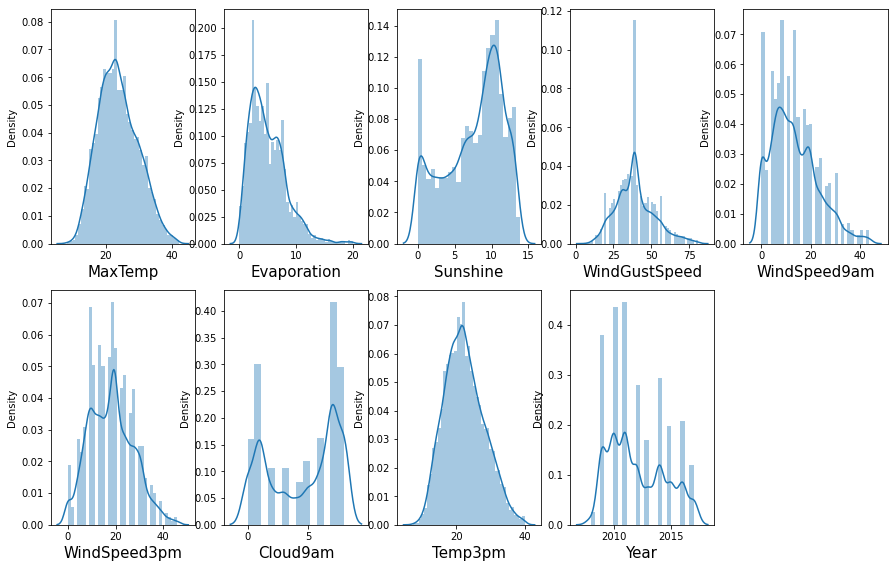

In [215]:
#  1.2 Checking skweness through Data Visualization also
collist=['MaxTemp', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']

plt.figure(figsize=(15,25), facecolor='white')
plotnumber = 1

for column in df_forecast[collist]:
    if plotnumber<=24:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(df_forecast[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

In [216]:
#  We can see all columns are skewed but some are highly skewed.

In [217]:
#  1.3 Removing skewness using yeo-johnson method
collist=['MaxTemp', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
df_forecast[collist]=power_transform(df_forecast[collist],method='yeo-johnson')
df_forecast[collist]

,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Cloud9am,Temp3pm,Year
0,-0.071880,-0.544949,1.678745,0.442340,0.778138,0.666546,1.167546,-0.021999,-4.323764e-13
1,0.292239,-0.924156,-0.054781,0.442340,-0.988180,0.468835,-1.243932,0.398495,-4.323764e-13
2,0.388343,0.062427,-0.028205,0.587139,0.694166,0.859933,-0.874970,0.216621,-4.323764e-13
3,0.745278,-1.142515,0.051841,-1.259440,-0.068886,-0.969979,1.167546,0.748824,-4.323764e-13
4,1.369814,-0.221302,1.130830,0.218369,-0.546401,0.266314,0.839957,1.230259,-4.323764e-13
...,...,...,...,...,...,...,...,...,...
8420,0.012573,0.599954,-1.607431,-0.599370,0.140561,-0.724664,1.167546,0.081288,5.176415e-13
8421,0.324418,1.892058,-0.186849,-1.466249,0.140561,-0.969979,-1.243932,0.431062,5.176415e-13
8422,0.576761,-0.075151,1.446457,-0.094353,-0.296013,-0.969979,0.508376,0.686382,5.176415e-13
8423,0.592242,-0.147079,1.475369,-0.871453,0.140561,-1.229329,-0.517940,0.670687,5.176415e-13


In [218]:
# 1.4 checking skewness again after removal
df_forecast.skew()

Location         -0.037561
MinTemp          -0.093740
MaxTemp          -0.013736
Rainfall         13.813712
Evaporation      -0.014722
Sunshine         -0.391426
WindGustDir       0.108185
WindGustSpeed     0.004693
WindDir9am        0.147656
WindDir3pm       -0.128780
WindSpeed9am     -0.110392
WindSpeed3pm     -0.076366
Humidity9am      -0.234755
Humidity3pm       0.125791
Pressure9am       0.013912
Pressure3pm       0.039745
Cloud9am         -0.358179
Cloud3pm         -0.226985
Temp9am          -0.034110
Temp3pm          -0.012605
RainToday         1.232970
RainTomorrow      1.257260
Day               0.005914
Month             0.053131
Year              0.000000
dtype: float64

In [219]:
#  Still we can see skewness is present but from earlier it is removed.

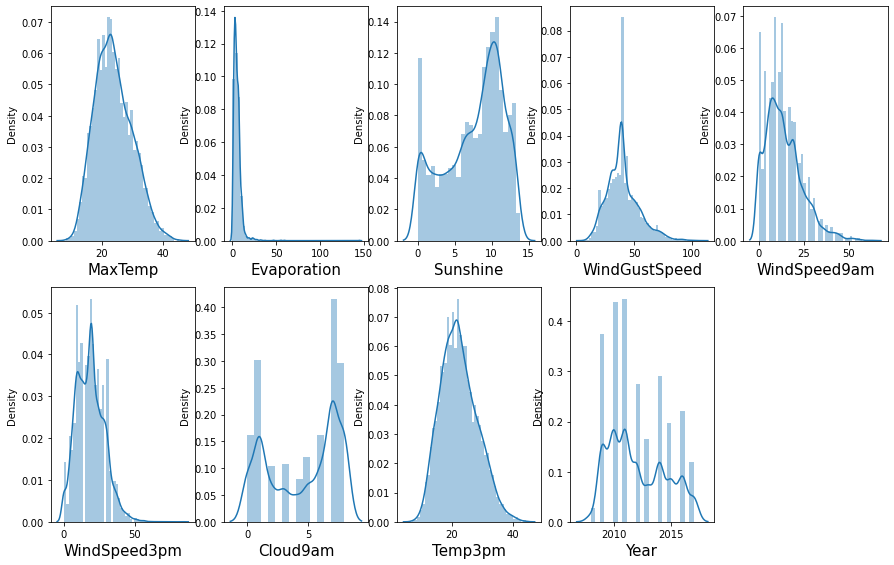

In [220]:
# 1.5 checking skewness after removal through data visualization using distplot
collist=['MaxTemp', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']

plt.figure(figsize=(15,25), facecolor='white')
plotnumber = 1

for column in df_forecast[collist]:
    if plotnumber<=24:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

In [221]:
#  2.1 Checking skewness of Target Column 'RainTomorrow'
#for Target variable 'RainTomorrow'
df_forecast1.skew()

MinTemp         -0.083677
MaxTemp          0.316669
Rainfall         3.510588
Evaporation      1.070337
Sunshine        -0.529068
WindGustDir      0.109142
WindGustSpeed    0.543210
WindDir9am       0.156007
WindDir3pm      -0.125105
WindSpeed9am     0.713157
WindSpeed3pm     0.298719
Humidity9am     -0.228988
Humidity3pm      0.125197
Pressure9am      0.010008
Pressure3pm      0.037371
Cloud9am        -0.305725
Cloud3pm        -0.215839
Temp9am         -0.033308
Temp3pm          0.335888
RainToday        1.302875
RainTomorrow     1.297762
Day              0.002697
Month            0.048897
Year             0.429681
dtype: float64

Observation:
Skewness threshold taken is +/-0.25
All the columns are not normallly distributed, they are skewed.
Columns which are having skewness: MaxTemp,Rainfall, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, RainToday, RainTomorrow, Year.
The Sunshine column data is negatively highly skewed and Rainfall is positively highly skewed
Since RainToday is categorical column and RainTomorrow is Target Column so we will not remove skewness.
So we will remove skewness from MaxTemp, Rainfall, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, Year.

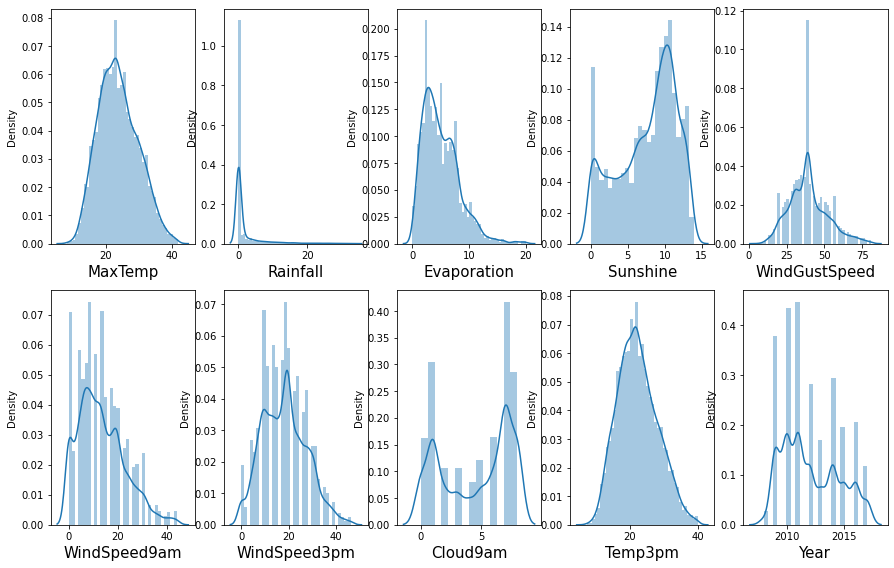

In [222]:
#  2.2 Checking skweness through Data Visualization also
collist1=['MaxTemp', 'Rainfall', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
plt.figure(figsize=(15,25), facecolor='white')
plotnumber = 1

for column in df_forecast1[collist1]:
    if plotnumber<=10:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(df_forecast1[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

We can see all columns are highly skewed but we will remove skewness only from continuous columns

In [223]:
#2.3 Removing skewness using yeo-johnson method
collist1=['MaxTemp', 'Rainfall', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
df_forecast1[collist1]=power_transform(df_forecast1[collist1],method='yeo-johnson')
df_forecast1[collist1]

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Cloud9am,Temp3pm,Year
0,-0.075735,0.774204,-0.543464,1.684305,0.446642,0.782414,0.666711,1.174241,-0.026447,-4.691803e-13
1,0.287171,-0.653653,-0.923204,-0.067397,0.446642,-0.984707,0.468766,-1.233968,0.392880,-4.691803e-13
2,0.383010,-0.653653,0.064332,-0.040650,0.591429,0.698440,0.860344,-0.861348,0.211457,-4.691803e-13
3,0.739151,-0.653653,-1.141970,0.039936,-1.254405,-0.064772,-0.971108,1.174241,0.742563,-4.691803e-13
4,1.363009,1.136761,-0.219528,1.129314,0.222704,-0.542548,0.266024,0.849862,1.223572,-4.691803e-13
...,...,...,...,...,...,...,...,...,...,...
8420,0.008408,-0.653653,0.601810,-1.619125,-0.594757,0.144747,-0.725708,1.174241,0.076513,5.621059e-13
8421,0.319259,-0.653653,1.892321,-0.200249,-1.461041,0.144747,-0.971108,-1.233968,0.425375,5.621059e-13
8422,0.570971,-0.653653,-0.073296,1.448890,-0.089942,-0.292006,-0.971108,0.520869,0.680214,5.621059e-13
8423,0.586418,-0.653653,-0.145260,1.478182,-0.866689,0.144747,-1.230490,-0.502739,0.664545,5.621059e-13


In [225]:
# 2.4 checking skewness after removal
df_forecast1.skew()

MinTemp         -0.083677
MaxTemp         -0.014551
Rainfall         1.042732
Evaporation     -0.014946
Sunshine        -0.390820
WindGustDir      0.109142
WindGustSpeed    0.004385
WindDir9am       0.156007
WindDir3pm      -0.125105
WindSpeed9am    -0.110813
WindSpeed3pm    -0.076182
Humidity9am     -0.228988
Humidity3pm      0.125197
Pressure9am      0.010008
Pressure3pm      0.037371
Cloud9am        -0.351533
Cloud3pm        -0.215839
Temp9am         -0.033308
Temp3pm         -0.013320
RainToday        1.302875
RainTomorrow     1.297762
Day              0.002697
Month            0.048897
Year             0.000000
dtype: float64

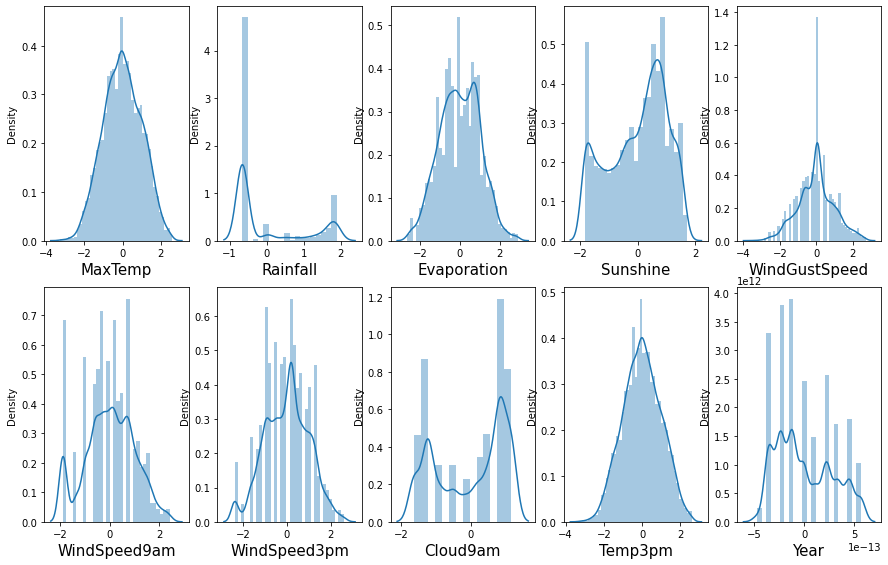

In [226]:
#   2.5 checking skewness after removal through data visualization using distplot
collist1=['MaxTemp', 'Rainfall', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
plt.figure(figsize=(15,25), facecolor='white')
plotnumber = 1

for column in df_forecast1[collist1]:
    if plotnumber<=10:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(df_forecast1[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

In [227]:
#  The data is not normal and the skewness is still present in some columns. But removed skewness from earlier.

Data preprocessing
Spliting data into Target and Features for Target column "Rainfall" :

In [228]:
x=df_forecast.drop("Rainfall",axis=1)
y=df_forecast["Rainfall"]

In [229]:
x.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [231]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,-0.071880,-0.544949,1.678745,13,0.442340,13,14,0.778138,0.666546,71.0,22.0,1007.7,1007.1,1.167546,8.0,16.9,-0.021999,0,0,1,12,-4.323764e-13
1,1,7.4,0.292239,-0.924156,-0.054781,14,0.442340,6,15,-0.988180,0.468835,44.0,25.0,1010.6,1007.8,-1.243932,4.0,17.2,0.398495,0,0,2,12,-4.323764e-13
2,1,12.9,0.388343,0.062427,-0.028205,15,0.587139,13,15,0.694166,0.859933,38.0,30.0,1007.6,1008.7,-0.874970,2.0,21.0,0.216621,0,0,3,12,-4.323764e-13
3,1,9.2,0.745278,-1.142515,0.051841,4,-1.259440,9,0,-0.068886,-0.969979,45.0,16.0,1017.6,1012.8,1.167546,7.0,18.1,0.748824,0,0,4,12,-4.323764e-13
4,1,17.5,1.369814,-0.221302,1.130830,13,0.218369,1,7,-0.546401,0.266314,82.0,33.0,1010.8,1006.0,0.839957,8.0,17.8,1.230259,0,0,5,12,-4.323764e-13


In [232]:
y.head()

0    0.6
1    0.0
2    0.0
3    0.0
4    1.0
Name: Rainfall, dtype: float64

In [233]:
x.shape, y.shape

((8075, 24), (8075,))

In [234]:
#   Spliting data into Target and Features for Target column "RainTomorrow"

In [235]:
x1=df_forecast1.drop("RainTomorrow",axis=1)
y1=df_forecast1["RainTomorrow"]

In [236]:
x1.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Day', 'Month', 'Year'],
      dtype='object')

In [237]:
x1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,13.4,-0.075735,0.774204,-0.543464,1.684305,13,0.446642,13,14,0.782414,0.666711,71.0,22.0,1007.7,1007.1,1.174241,8.0,16.9,-0.026447,0,1,12,-4.691803e-13
1,7.4,0.287171,-0.653653,-0.923204,-0.067397,14,0.446642,6,15,-0.984707,0.468766,44.0,25.0,1010.6,1007.8,-1.233968,4.0,17.2,0.392880,0,2,12,-4.691803e-13
2,12.9,0.383010,-0.653653,0.064332,-0.040650,15,0.591429,13,15,0.698440,0.860344,38.0,30.0,1007.6,1008.7,-0.861348,2.0,21.0,0.211457,0,3,12,-4.691803e-13
3,9.2,0.739151,-0.653653,-1.141970,0.039936,4,-1.254405,9,0,-0.064772,-0.971108,45.0,16.0,1017.6,1012.8,1.174241,7.0,18.1,0.742563,0,4,12,-4.691803e-13
4,17.5,1.363009,1.136761,-0.219528,1.129314,13,0.222704,1,7,-0.542548,0.266024,82.0,33.0,1010.8,1006.0,0.849862,8.0,17.8,1.223572,0,5,12,-4.691803e-13


In [238]:
y1.head()

0    0
1    0
2    0
3    0
4    0
Name: RainTomorrow, dtype: int32

In [239]:
x1.shape, y1.shape

((7965, 23), (7965,))

In [240]:
y1.value_counts()

0    6150
1    1815
Name: RainTomorrow, dtype: int64

In [241]:
#   The data is not balanced. So, we will use oversampling method to balance it.

In [242]:
#  Oversampling using the SMOTE
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

In [243]:
SM = SMOTE()
x1, y1 = SM.fit_resample(x1,y1)

In [244]:
y1.value_counts()

0    6150
1    6150
Name: RainTomorrow, dtype: int64

After using oversampling method, we check that now our data is balanced.

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

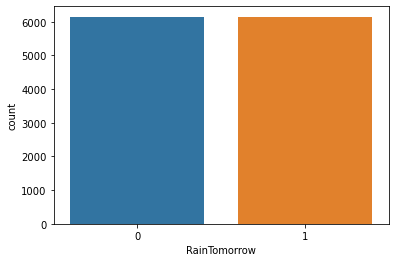

In [245]:
#checking through visualization also
sns.countplot(y1)

Now, our data is balanced.

Scaling data using Standard Scaler
For Target Column "Rainfall"

In [246]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [247]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,-1.507941,0.048287,-0.071880,-0.544949,1.678745,1.226580,0.442340,1.238851,1.398607,0.778138,0.666546,0.172990,-1.625182,-1.685494,-1.402277,1.167546,1.287002,-0.142208,-0.021999,-0.558326,-0.5526,-1.670796,1.629984,-1.667933
1,-1.507941,-1.069909,0.292239,-0.924156,-0.054781,1.439263,0.442340,-0.285941,1.624952,-0.988180,0.468835,-1.460520,-1.460026,-1.200983,-1.283985,-1.243932,-0.179835,-0.088109,0.398495,-0.558326,-0.5526,-1.557208,1.629984,-1.667933
2,-1.507941,-0.044896,0.388343,0.062427,-0.028205,1.651946,0.587139,1.238851,1.624952,0.694166,0.859933,-1.823522,-1.184768,-1.702202,-1.131895,-0.874970,-0.913254,0.597136,0.216621,-0.558326,-0.5526,-1.443619,1.629984,-1.667933
3,-1.507941,-0.734450,0.745278,-1.142515,0.051841,-0.687565,-1.259440,0.367542,-1.770234,-0.068886,-0.969979,-1.400020,-1.955492,-0.031472,-0.439040,1.167546,0.920293,0.074186,0.748824,-0.558326,-0.5526,-1.330031,1.629984,-1.667933
4,-1.507941,0.812387,1.369814,-0.221302,1.130830,1.226580,0.218369,-1.375078,-0.185814,-0.546401,0.266314,0.838494,-1.019613,-1.167568,-1.588165,0.839957,1.287002,0.020087,1.230259,-0.558326,-0.5526,-1.216443,1.629984,-1.667933


In [248]:
#  For Target Column "RainTomorrow"
scaler = StandardScaler()
x1 = pd.DataFrame(scaler.fit_transform(x1), columns = x1.columns)

In [249]:
x1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-0.000722,0.024498,0.541409,-0.506485,1.884405,1.276032,0.342869,1.300033,1.478700,0.772510,0.653602,0.011887,-1.801878,-1.616199,-1.331907,1.092750,1.162838,-0.127802,0.101297,-0.592248,-1.672622,1.731054,-1.730254
1,-1.149793,0.390843,-0.819326,-0.906700,0.070859,1.497709,0.342869,-0.272190,1.713983,-1.053616,0.454334,-1.645941,-1.644992,-1.124807,-1.212977,-1.464426,-0.383864,-0.072306,0.521001,-0.592248,-1.557598,1.731054,-1.730254
2,-0.096478,0.487590,-0.819326,0.134083,0.098550,1.719386,0.490473,1.300033,1.713983,0.685732,0.848530,-2.014348,-1.383514,-1.633143,-1.060067,-1.068757,-1.157215,0.630642,0.339415,-0.592248,-1.442575,1.731054,-1.730254
3,-0.805072,0.847107,-0.819326,-1.137262,0.181981,-0.719063,-1.391267,0.401620,-1.815250,-0.102964,-0.995162,-1.584540,-2.115652,0.061311,-0.363477,1.092750,0.776163,0.094182,0.870999,-0.592248,-1.327551,1.731054,-1.730254
4,0.784477,1.476877,0.886922,-0.165083,1.309820,1.276032,0.114575,-1.395207,-0.168275,-0.596693,0.250238,0.687299,-1.226627,-1.090918,-1.518797,0.748305,1.162838,0.038686,1.352440,-0.592248,-1.212527,1.731054,-1.730254


Variance Threshold Method
It removes all features which variance doesn't meet some threshold. By default, it removes all zero-variance features.

In [250]:
#   For Target Column "Rainfall"
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x)

VarianceThreshold(threshold=0)

In [251]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

In [252]:
x.columns[var_threshold.get_support()]

Index(['Location', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [253]:
# taking  out  all the  constant  columns 
cons_columns = [column for column in x.columns
               if column not in x.columns[var_threshold.get_support()]]
print(len(cons_columns))

0


So we can see that, with the help of variance threshold method, we got to know that all features are important.

In [254]:
x.shape

(8075, 24)

In [255]:
x.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

For Target Column "RainTomorrow"

In [256]:
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x1)

VarianceThreshold(threshold=0)

In [257]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True])

In [258]:
x1.columns[var_threshold.get_support()]

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Day', 'Month', 'Year'],
      dtype='object')

In [259]:
# taking  out  all the  constant  columns 
cons_columns1 = [column for column in x1.columns
               if column not in x1.columns[var_threshold.get_support()]]
print(len(cons_columns))

0


So we can see that, with the help of variance threshold method, we got to know that except 1 feature "Month" all other features are important. So we will drop that "Month" feature.

In [260]:
x1 = x1.drop([ "Month"],axis=1)

In [261]:
x1.shape

(12300, 22)

In [262]:
x1.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Day', 'Year'],
      dtype='object')

Now we will use SelectKBest method.

In [263]:
# SelectKBest method
# For Target Column "Rainfall"

In [264]:
best_fit = SelectKBest(score_func = f_classif, k ='all')
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [265]:
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(24,'Score'))

          Feature         Score
19      RainToday  1.517334e+15
11    Humidity9am  8.640268e+00
12    Humidity3pm  8.108387e+00
20   RainTomorrow  6.718373e+00
18        Temp3pm  3.676840e+00
2         MaxTemp  3.418025e+00
15       Cloud9am  3.239495e+00
16       Cloud3pm  2.986292e+00
4        Sunshine  2.656547e+00
7      WindDir9am  2.230995e+00
3     Evaporation  2.076661e+00
5     WindGustDir  1.940779e+00
13    Pressure9am  1.911626e+00
10   WindSpeed3pm  1.899179e+00
23           Year  1.831269e+00
6   WindGustSpeed  1.692609e+00
17        Temp9am  1.640899e+00
9    WindSpeed9am  1.639288e+00
8      WindDir3pm  1.522741e+00
14    Pressure3pm  1.474266e+00
1         MinTemp  1.397160e+00
0        Location  1.365839e+00
21            Day  1.284911e+00
22          Month  1.240900e+00


Selecting the best features based on above scores, we can see that the column "Month" has most lowest features for the prediction, so we will drop this column.

In [266]:
x = x.drop([ "Month"],axis=1)

In [267]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Year
0,-1.507941,0.048287,-0.071880,-0.544949,1.678745,1.226580,0.442340,1.238851,1.398607,0.778138,0.666546,0.172990,-1.625182,-1.685494,-1.402277,1.167546,1.287002,-0.142208,-0.021999,-0.558326,-0.5526,-1.670796,-1.667933
1,-1.507941,-1.069909,0.292239,-0.924156,-0.054781,1.439263,0.442340,-0.285941,1.624952,-0.988180,0.468835,-1.460520,-1.460026,-1.200983,-1.283985,-1.243932,-0.179835,-0.088109,0.398495,-0.558326,-0.5526,-1.557208,-1.667933
2,-1.507941,-0.044896,0.388343,0.062427,-0.028205,1.651946,0.587139,1.238851,1.624952,0.694166,0.859933,-1.823522,-1.184768,-1.702202,-1.131895,-0.874970,-0.913254,0.597136,0.216621,-0.558326,-0.5526,-1.443619,-1.667933
3,-1.507941,-0.734450,0.745278,-1.142515,0.051841,-0.687565,-1.259440,0.367542,-1.770234,-0.068886,-0.969979,-1.400020,-1.955492,-0.031472,-0.439040,1.167546,0.920293,0.074186,0.748824,-0.558326,-0.5526,-1.330031,-1.667933
4,-1.507941,0.812387,1.369814,-0.221302,1.130830,1.226580,0.218369,-1.375078,-0.185814,-0.546401,0.266314,0.838494,-1.019613,-1.167568,-1.588165,0.839957,1.287002,0.020087,1.230259,-0.558326,-0.5526,-1.216443,-1.667933


In [268]:
# For Target Column "RainTomorrow"

In [269]:
best_fit1 = SelectKBest(score_func = f_classif, k ='all')
fit1 = best_fit1.fit(x1,y1)
dfscores1 = pd.DataFrame(fit.scores_)
dfcolumns1 = pd.DataFrame(x1.columns)

In [270]:
fit1 = best_fit1.fit(x1,y1)
dfscores1 = pd.DataFrame(fit1.scores_)
dfcolumns1 = pd.DataFrame(x1.columns)
dfcolumns1.head()
featureScores1 = pd.concat([dfcolumns1,dfscores1],axis = 1)
featureScores1.columns = ['Feature', 'Score']
print(featureScores1.nlargest(22,'Score'))

          Feature        Score
12    Humidity3pm  4137.963874
16       Cloud3pm  1890.998487
2        Rainfall  1833.179300
11    Humidity9am  1458.377122
15       Cloud9am  1121.879934
4        Sunshine   952.327663
18        Temp3pm   718.548569
19      RainToday   670.189681
6   WindGustSpeed   558.705881
1         MaxTemp   430.856011
13    Pressure9am   407.081503
14    Pressure3pm   264.525924
3     Evaporation   163.813040
0         MinTemp   149.892485
9    WindSpeed9am    57.841538
10   WindSpeed3pm    16.724656
5     WindGustDir    10.518149
17        Temp9am     9.298743
20            Day     9.271335
8      WindDir3pm     5.697816
21           Year     4.075190
7      WindDir9am     0.013795


Selecting the best features based on above scores, we can see that the column "WindDir9am" has most lowest features for the prediction, so we will drop this column.

In [271]:
x1 = x1.drop([ "WindDir9am"],axis=1)
x1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Year
0,-0.000722,0.024498,0.541409,-0.506485,1.884405,1.276032,0.342869,1.478700,0.772510,0.653602,0.011887,-1.801878,-1.616199,-1.331907,1.092750,1.162838,-0.127802,0.101297,-0.592248,-1.672622,-1.730254
1,-1.149793,0.390843,-0.819326,-0.906700,0.070859,1.497709,0.342869,1.713983,-1.053616,0.454334,-1.645941,-1.644992,-1.124807,-1.212977,-1.464426,-0.383864,-0.072306,0.521001,-0.592248,-1.557598,-1.730254
2,-0.096478,0.487590,-0.819326,0.134083,0.098550,1.719386,0.490473,1.713983,0.685732,0.848530,-2.014348,-1.383514,-1.633143,-1.060067,-1.068757,-1.157215,0.630642,0.339415,-0.592248,-1.442575,-1.730254
3,-0.805072,0.847107,-0.819326,-1.137262,0.181981,-0.719063,-1.391267,-1.815250,-0.102964,-0.995162,-1.584540,-2.115652,0.061311,-0.363477,1.092750,0.776163,0.094182,0.870999,-0.592248,-1.327551,-1.730254
4,0.784477,1.476877,0.886922,-0.165083,1.309820,1.276032,0.114575,-0.168275,-0.596693,0.250238,0.687299,-1.226627,-1.090918,-1.518797,0.748305,1.162838,0.038686,1.352440,-0.592248,-1.212527,-1.730254


Now, we have completed features selection process through using 2 techniques. So we will check for multicolinearity.

Checking for Multicolinearity
 
 VIF (Variance Inflation factor)

For Target Column "Rainfall"

In [272]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.587615,Location
1,8.163903,MinTemp
2,26.609627,MaxTemp
3,1.222927,Evaporation
4,1.289062,Sunshine
5,1.614985,WindGustDir
6,2.321362,WindGustSpeed
7,1.352142,WindDir9am
8,1.488364,WindDir3pm
9,2.006342,WindSpeed9am


The VIF value is more than 10 in the columns MaxTemp, 'Pressure9am', 'Pressure3pm', 'Temp9am' and 'Temp3pm'. But column 'Temp3pm' is having highest VIF value. So, we will drop column 'Temp3pm'. Also we will drop 'Year' column as it have no relation.

In [273]:
x.drop('Temp3pm', axis =1, inplace=True)

In [274]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow,Day,Year
0,-1.507941,0.048287,-0.071880,-0.544949,1.678745,1.226580,0.442340,1.238851,1.398607,0.778138,0.666546,0.172990,-1.625182,-1.685494,-1.402277,1.167546,1.287002,-0.142208,-0.558326,-0.5526,-1.670796,-1.667933
1,-1.507941,-1.069909,0.292239,-0.924156,-0.054781,1.439263,0.442340,-0.285941,1.624952,-0.988180,0.468835,-1.460520,-1.460026,-1.200983,-1.283985,-1.243932,-0.179835,-0.088109,-0.558326,-0.5526,-1.557208,-1.667933
2,-1.507941,-0.044896,0.388343,0.062427,-0.028205,1.651946,0.587139,1.238851,1.624952,0.694166,0.859933,-1.823522,-1.184768,-1.702202,-1.131895,-0.874970,-0.913254,0.597136,-0.558326,-0.5526,-1.443619,-1.667933
3,-1.507941,-0.734450,0.745278,-1.142515,0.051841,-0.687565,-1.259440,0.367542,-1.770234,-0.068886,-0.969979,-1.400020,-1.955492,-0.031472,-0.439040,1.167546,0.920293,0.074186,-0.558326,-0.5526,-1.330031,-1.667933
4,-1.507941,0.812387,1.369814,-0.221302,1.130830,1.226580,0.218369,-1.375078,-0.185814,-0.546401,0.266314,0.838494,-1.019613,-1.167568,-1.588165,0.839957,1.287002,0.020087,-0.558326,-0.5526,-1.216443,-1.667933


In [275]:
# Checking again Multicolinearity using VIF
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.583624,Location
1,8.095623,MinTemp
2,9.580665,MaxTemp
3,1.222909,Evaporation
4,1.288736,Sunshine
5,1.612638,WindGustDir
6,2.301174,WindGustSpeed
7,1.351992,WindDir9am
8,1.486862,WindDir3pm
9,2.006228,WindSpeed9am


Here we can see that Multicolinearity is still present in the column 'Pressure9am', 'Pressure3pm' and 'Temp9am'. So, we will again drop highest VIF value column which is 'Pressure9am' for removing Multicolinearity.

In [276]:
x.drop('Pressure9am', axis =1, inplace=True)

In [277]:
#  Checking again Multicolinearity using VIF
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.583534,Location
1,7.930167,MinTemp
2,9.190422,MaxTemp
3,1.220423,Evaporation
4,1.287802,Sunshine
5,1.597655,WindGustDir
6,2.272936,WindGustSpeed
7,1.329488,WindDir9am
8,1.418625,WindDir3pm
9,2.001932,WindSpeed9am


Here we can see that Multicolinearity is still present in the column 'Temp9am'. So, we will again drop highest VIF value column which is 'Temp9am' for removing Multicolinearity.

In [278]:
x.drop('Temp9am', axis =1, inplace=True)

In [279]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.583317,Location
1,4.334916,MinTemp
2,5.264511,MaxTemp
3,1.220133,Evaporation
4,1.286453,Sunshine
5,1.596549,WindGustDir
6,2.239590,WindGustSpeed
7,1.329440,WindDir9am
8,1.418273,WindDir3pm
9,1.985440,WindSpeed9am


In [280]:
# For Target Column "RainTomorrow"
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,8.985499,MinTemp
1,24.587008,MaxTemp
2,4.794514,Rainfall
3,1.238098,Evaporation
4,1.273048,Sunshine
5,1.450616,WindGustDir
6,2.087865,WindGustSpeed
7,1.491850,WindDir3pm
8,2.005396,WindSpeed9am
9,2.058443,WindSpeed3pm


In [281]:
  #  The VIF value is more than 10 in the columns MaxTemp, 'Pressure9am', 'Pressure3pm', 'Temp9am' and 'Temp3pm'. But column 'Temp3pm' is having highest VIF value. So, we will drop column 'Temp3pm'. Also we will drop 'Year' column as it have no relation.

x1.drop('Year', axis =1, inplace=True)

In [282]:
x1.drop('Temp3pm', axis =1, inplace=True)

In [283]:
# Checking again Multicolinearity using VIF
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,8.685257,MinTemp
1,9.988173,MaxTemp
2,4.790225,Rainfall
3,1.230940,Evaporation
4,1.267027,Sunshine
5,1.441880,WindGustDir
6,2.052520,WindGustSpeed
7,1.481466,WindDir3pm
8,2.005065,WindSpeed9am
9,2.050104,WindSpeed3pm


here we can see that Multicolinearity is still present in the column 'MaxTemp', 'Pressure9am', 'Pressure3pm' and 'Temp9am'. So, we will again drop highest VIF value column which is 'Pressure9am' for removing Multicolinearity.

In [284]:
x1.drop('Pressure9am', axis =1, inplace=True)

In [285]:
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,8.502493,MinTemp
1,9.609704,MaxTemp
2,4.776578,Rainfall
3,1.229892,Evaporation
4,1.267018,Sunshine
5,1.411548,WindGustDir
6,2.033351,WindGustSpeed
7,1.393439,WindDir3pm
8,2.004781,WindSpeed9am
9,2.038045,WindSpeed3pm


Here we can see that Multicolinearity is still present in the column 'MaxTemp' and 'Temp9am'. So, we will again drop highest VIF value column which is 'Temp9am' for removing Multicolinearity.

In [286]:
x1.drop('Temp9am', axis =1, inplace=True)

In [287]:
# Checking again Multicolinearity using VIF

In [288]:
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,4.375783,MinTemp
1,5.342618,MaxTemp
2,4.771339,Rainfall
3,1.229800,Evaporation
4,1.263606,Sunshine
5,1.410544,WindGustDir
6,2.006838,WindGustSpeed
7,1.393178,WindDir3pm
8,1.988400,WindSpeed9am
9,1.997309,WindSpeed3pm


Now, we can check Multicolinearity is removed from the columns as VIF value of all columns are less than 10. So, we will create model now.

# Creating Model

We are using Regression Model for Target Variable, Rainfall as it is continuous column and Classification Model for Target Variable, RainTomorrow as it is categorical column.

Regression Model

Finding the best random state among all the models

In [294]:
maxAcc = 0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = i)
    modDTR =  DecisionTreeRegressor()
    modDTR.fit(x_train,y_train)
    pred = modDTR.predict(x_test)
    acc  = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print(f"Best Accuracy is: {maxAcc} on random_state: {maxRS}")

Best Accuracy is: 0.5353492351216693 on random_state: 70


In [295]:
#  Creating train-test-split
# creating new train test split using the random state.
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = 28)

In [296]:
# Linear Regression
# Checking r2score for Linear Regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
print('R2_score:',r2_score(y_test,predLR))
print('Mean abs error:',mean_absolute_error(y_test, predLR))
print('Mean squared error:',mean_squared_error(y_test, predLR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predLR)))

R2_score: 0.2148632164349764
Mean abs error: 3.1861012607092483
Mean squared error: 85.5004637436923
Root Mean Squared Error:  9.246646080806396


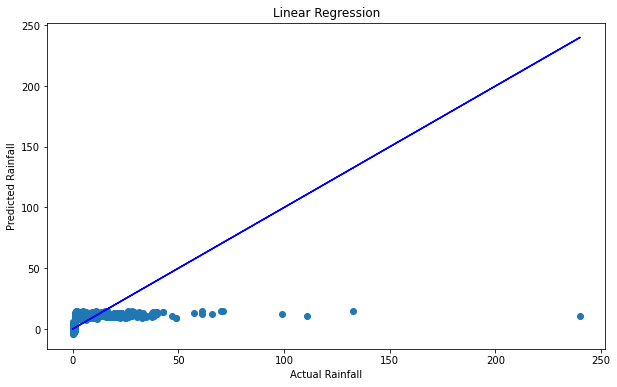

In [297]:
# Checking the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predLR,cmap='set1')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Linear Regression")
plt.show()

In [298]:
# Random forest Regression Model
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor(n_estimators=600, random_state=28)
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))
print('Mean abs error:',mean_absolute_error(y_test, predRFR))
print('Mean squared error:',mean_squared_error(y_test, predRFR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predRFR)))

R2_Score: 0.33031516266703864
Mean abs error: 2.05935036119711
Mean squared error: 72.92788384477123
Root Mean Squared Error:  8.539782423737226


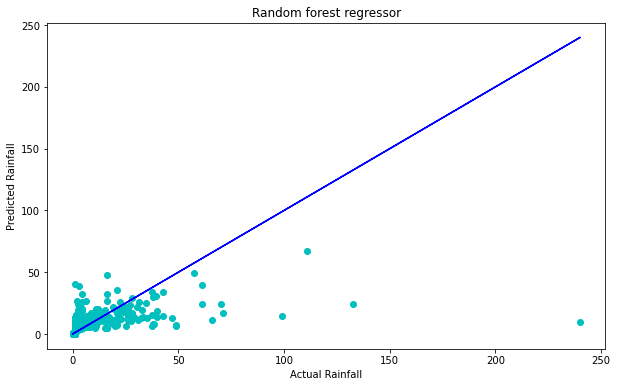

In [299]:
# Checking the performance of the model by graph
#Verifying the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predRFR,color='c')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Random forest regressor")
plt.show()

In [300]:
# KNN Regressor
# Checking R2 score for KNN regressor
knn=KNeighborsRegressor(n_neighbors=9 )
knn.fit(x_train,y_train)

#prediction
predknn=knn.predict(x_test)
print('R2_Score:',r2_score(y_test,predknn))
print('Mean abs error:',mean_absolute_error(y_test, predknn))
print('Mean squared error:',mean_squared_error(y_test, predknn))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predknn)))

R2_Score: 0.22319386305418065
Mean abs error: 2.2126040591675267
Mean squared error: 84.59326621564806
Root Mean Squared Error:  9.197459769721641


Text(0.5, 1.0, 'K-nearest neighbors  regressor')

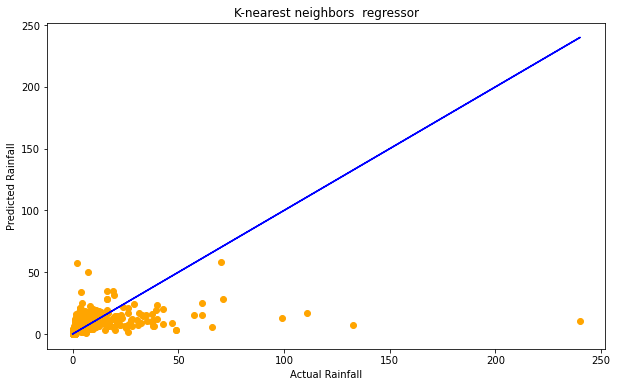

In [301]:
# Checking the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predknn,color='orange')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("K-nearest neighbors  regressor")

In [302]:
# Support Vector Regression Model
# Checking R2 score for svr
sv= SVR(kernel='linear')
sv.fit(x_train,y_train)


#prediction
predsv=sv.predict(x_test)
print('R2_Score:',r2_score(y_test,predsv))
print('Mean abs error:',mean_absolute_error(y_test, predsv))
print('Mean squared error:',mean_squared_error(y_test, predsv))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predsv)))

R2_Score: 0.14667721996753103
Mean abs error: 2.14286587743564
Mean squared error: 92.92583781968541
Root Mean Squared Error:  9.639804864191257


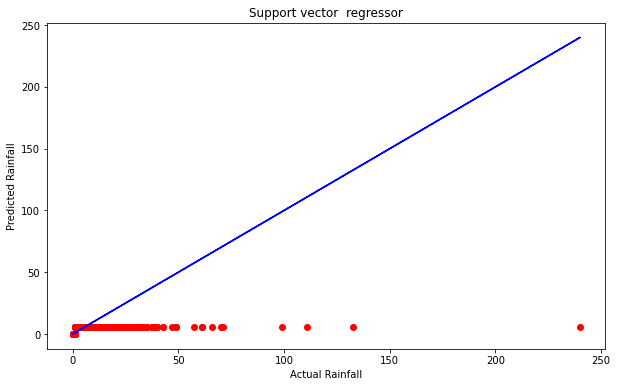

In [303]:
# Checking the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predsv,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Support vector  regressor")
plt.show()

In [304]:
# Grdient boosting Regressor
# Checking R2 score for GBR
Gb= GradientBoostingRegressor(n_estimators=400,  random_state=29, learning_rate=0.1, max_depth=3)
Gb.fit(x_train,y_train)

#prediction
predGb=Gb.predict(x_test)
print('R2_Score:',r2_score(y_test,predGb))
print('Mean abs error:',mean_absolute_error(y_test, predGb))
print('Mean squared error:',mean_squared_error(y_test, predGb))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predGb)))

R2_Score: 0.2781395603176663
Mean abs error: 2.5091533622749824
Mean squared error: 78.60974500623898
Root Mean Squared Error:  8.86621367925672


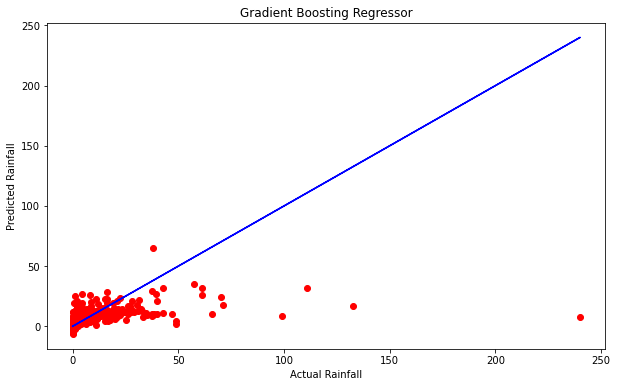

In [305]:
# Checking the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Gradient Boosting Regressor")
plt.show()

In [306]:
# Decision Tree Regressor
# Checking R2 score for GBR
DTR= DecisionTreeRegressor()
DTR.fit(x_train,y_train)

#prediction
predDTR=DTR.predict(x_test)
print('R2_Score:',r2_score(y_test,predDTR))
print('Mean abs error:',mean_absolute_error(y_test, predDTR))
print('Mean squared error:',mean_squared_error(y_test, predDTR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predDTR)))

R2_Score: -1.0953265095488942
Mean abs error: 2.8406811145510833
Mean squared error: 228.17856965944273
Root Mean Squared Error:  15.105580745520601


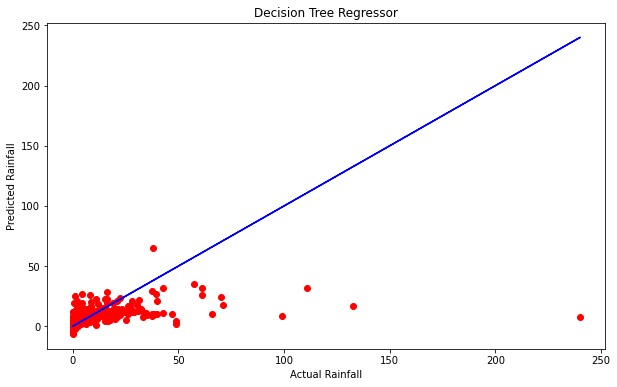

In [307]:
# Checking the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Decision Tree Regressor")
plt.show()

In [308]:
# LASSO Regression
# Checking R2 score for Lasso Regression
lasso = Lasso()
lasso.fit(x_train,y_train)
#prediction
predLasso=lasso.predict(x_test)
print('R2_Score:',r2_score(y_test,predLasso))
print('Mean abs error:',mean_absolute_error(y_test, predLasso))
print('Mean squared error:',mean_squared_error(y_test, predLasso))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predLasso)))

R2_Score: 0.20039869365212115
Mean abs error: 2.6425849550525826
Mean squared error: 87.07563310481916
Root Mean Squared Error:  9.331432532297448


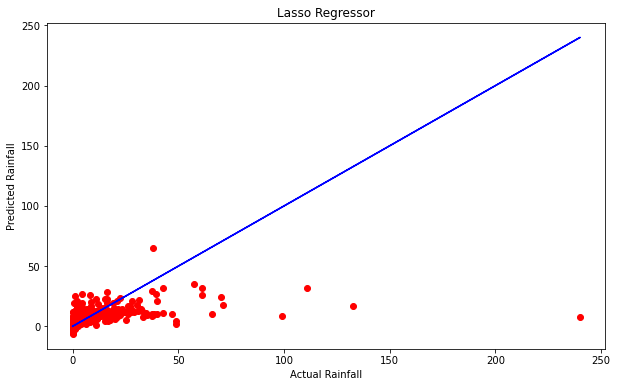

In [309]:
# Checking the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Lasso Regressor")
plt.show()

In [310]:
# Cross Validation Score for all the model
#CV Score for Linear Regression
print('CV score for Linear Regression: ',cross_val_score(LR,x,y,cv=5).mean())

CV score for Linear Regression:  0.24700877381884406


In [311]:
#CV Score for Random Forest Regression
print('CV score for Random forest Regression: ',cross_val_score(RFR,x,y,cv=5).mean())
#CV Score for KNN Regression
print('CV score for KNN Regression: ',cross_val_score(knn,x,y,cv=5).mean())
#CV Score for Support Vector Regression
print('CV score for Support Vector  Regression: ',cross_val_score(sv,x,y,cv=5).mean())
#CV Score for Gradient Boosting Regression
print('CV score for Gradient Boosting Regression: ',cross_val_score(Gb,x,y,cv=5).mean())
#CV Score for Decision Tree Regression
print('CV score for Decision Tree Regression: ',cross_val_score(DTR,x,y,cv=7).mean())
#CV Score for LASSO Regression
print('CV score for LASSO Regression: ',cross_val_score(lasso,x,y,cv=5).mean())

CV score for Random forest Regression:  0.4027504156150273
CV score for KNN Regression:  0.27085891395640777
CV score for Support Vector  Regression:  0.17906791033662003
CV score for Gradient Boosting Regression:  0.2919072681861098
CV score for Decision Tree Regression:  -0.07100589739088432
CV score for LASSO Regression:  0.23355379513778035


From the observation of accuracy and cross validation score and their difference we can predict that Random Forest Regressor is the best model.

# Hyper Parameter Tuning

The Random Forest Regressor with GridsearchCV

In [312]:
RFR=RandomForestRegressor(n_estimators = 500, random_state = 1, n_jobs = -1)

In [313]:
grid_params = {
                'criterion':['mse', 'mae'],
             'max_features':['auto', 'sqrt', 'log2'],
             'n_estimators':[0,200],
             'max_depth':[2,4,6]
                }

In [314]:
CV_RFR = GridSearchCV(RandomForestRegressor(), grid_params, cv = 5)

In [315]:
CV_RFR.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [2, 4, 6],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [0, 200]})

In [316]:
CV_RFR.best_params_

{'criterion': 'mse',
 'max_depth': 6,
 'max_features': 'log2',
 'n_estimators': 200}

In [317]:
Rain_forecast = RandomForestRegressor(random_state=50, n_estimators=200,max_depth= 6, max_features= 'log2')
Rain_forecast.fit(x_train, y_train)
#prediction
RFRpred = Rain_forecast.predict(x_test)
#R2 score
acc = r2_score(y_test,RFRpred)
print(acc*100)

25.364796566007175


In [318]:
# So, after the Hypertuning now we got a accuracy score of 25% on Random Forest Regression

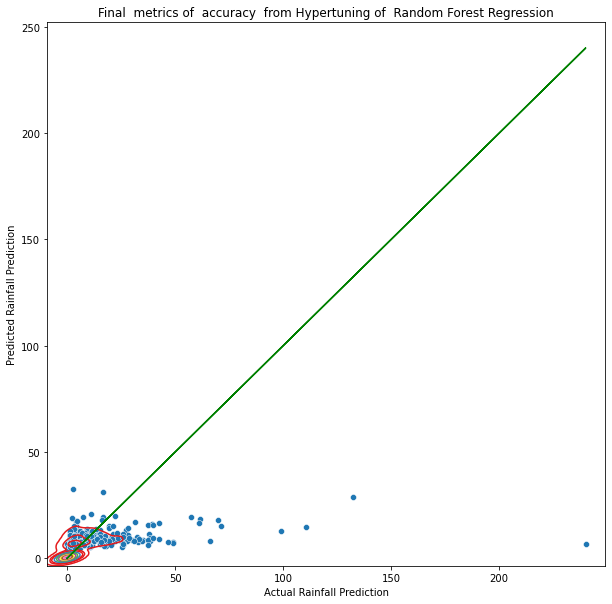

In [319]:
#Verifying the final  performance of the model by graph
plt.figure(figsize=(10,10))
sns.scatterplot(x=y_test,y=RFRpred,palette='Set2')
sns.kdeplot(x=y_test,y=RFRpred, cmap='Set1')
plt.plot(y_test,y_test,color='g')
#Verifying the performance of the model by graph
plt.xlabel("Actual Rainfall Prediction")
plt.ylabel("Predicted Rainfall Prediction")
plt.title("Final  metrics of  accuracy  from Hypertuning of  Random Forest Regression")
plt.show()

In [320]:
#saving the model at local file system
filename='Rainfall_Prediction.pickle'
pickle.dump(Rain_forecast,open(filename,'wb'))
#prediction using the saved model
loaded_model_r = pickle.load(open(filename, 'rb'))
loaded_model_r.predict(x_test)

array([0.33335345, 0.56258385, 0.87150784, ..., 0.2307882 , 0.92109869,
       0.49014647])

In [322]:
#Prediction of Regressor Model
import numpy as np
a = np.array(y_test)
predicted = np.array(loaded_model_r.predict(x_test))
Rainfall_Forecasting = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
Rainfall_Forecasting

,Original,Predicted
0,0.0,0.333353
1,0.2,0.562584
2,0.2,0.871508
3,0.0,0.423753
4,0.0,0.477684
...,...,...
1610,0.0,0.281102
1611,2.6,7.251266
1612,0.0,0.230788
1613,0.0,0.921099


In [323]:
# Classification Model
# Finding the best random state among all the models
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size=.30, random_state =i)
    DTC = DecisionTreeClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8631436314363143  on Random_state  62


In [324]:
# Creating train-test-split
# creating new train test split using the random state.
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=.30,random_state=maxRS)

In [325]:
x1.shape, y1.shape

((12300, 17), (12300,))

In [326]:
x_train.shape,y_train.shape, x_test.shape,y_test.shape

((8610, 17), (8610,), (3690, 17), (3690,))

In [327]:
# Random Forest Classifier
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_rfc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_rfc))
print("classification_report: \n",classification_report(y_test,pred_rfc))

accuracy_score:  0.9195121951219513
confusion_matrix: 
 [[1662  129]
 [ 168 1731]]
classification_report: 
               precision    recall  f1-score   support

           0       0.91      0.93      0.92      1791
           1       0.93      0.91      0.92      1899

    accuracy                           0.92      3690
   macro avg       0.92      0.92      0.92      3690
weighted avg       0.92      0.92      0.92      3690



Text(0.5, 1.0, 'RFC prediction Confusion_matrix')

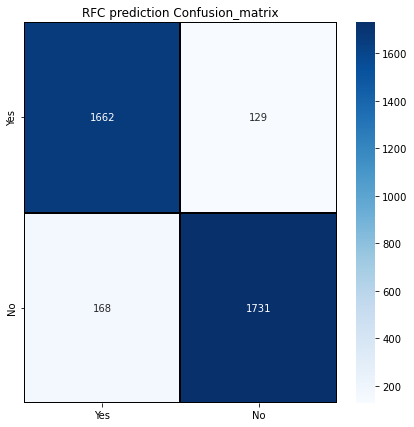

In [328]:
# Confusion Matrix for RFC
cm = confusion_matrix(y_test,pred_rfc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("RFC prediction Confusion_matrix")

In [330]:
# Decision Tree Classifier
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_dtc = dtc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_dtc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_dtc))
print("classification_report: \n",classification_report(y_test,pred_dtc))

accuracy_score:  0.8617886178861789
confusion_matrix: 
 [[1533  258]
 [ 252 1647]]
classification_report: 
               precision    recall  f1-score   support

           0       0.86      0.86      0.86      1791
           1       0.86      0.87      0.87      1899

    accuracy                           0.86      3690
   macro avg       0.86      0.86      0.86      3690
weighted avg       0.86      0.86      0.86      3690



Text(0.5, 1.0, 'DTC prediction Confusion_matrix')

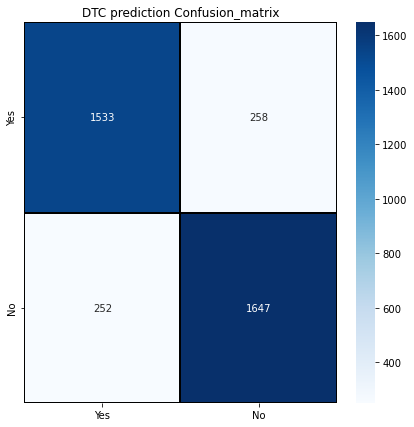

In [331]:
# Confusion Matrix for DTC
cm = confusion_matrix(y_test,pred_dtc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("DTC prediction Confusion_matrix")

In [332]:
# Support Vector Machine Classifier
svc = SVC(kernel='linear', gamma=3)
svc.fit(x_train,y_train)
pred_svc = svc.predict(x_test)

print("accuracy_score: ", accuracy_score(y_test, pred_svc))
print("confusion_matrix: \n", confusion_matrix(y_test, pred_svc))
print("classification_report: \n", classification_report(y_test,pred_svc))

accuracy_score:  0.7739837398373983
confusion_matrix: 
 [[1441  350]
 [ 484 1415]]
classification_report: 
               precision    recall  f1-score   support

           0       0.75      0.80      0.78      1791
           1       0.80      0.75      0.77      1899

    accuracy                           0.77      3690
   macro avg       0.78      0.77      0.77      3690
weighted avg       0.78      0.77      0.77      3690



Text(0.5, 1.0, 'SVC prediction Confusion_matrix')

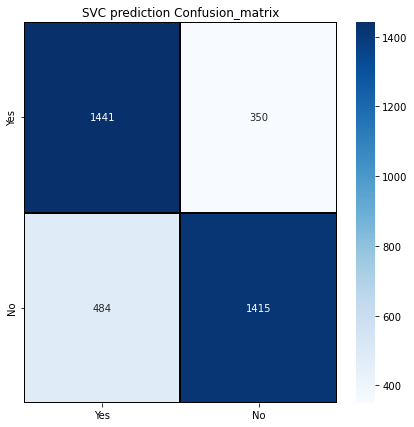

In [333]:
# Confusion Matrix for SVC
cm = confusion_matrix(y_test,pred_svc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("SVC prediction Confusion_matrix")

In [334]:
# KNN Classifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)
pred_knn = knn.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_knn))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_knn))
print("classification_report: \n",classification_report(y_test,pred_knn))

accuracy_score:  0.8409214092140921
confusion_matrix: 
 [[1335  456]
 [ 131 1768]]
classification_report: 
               precision    recall  f1-score   support

           0       0.91      0.75      0.82      1791
           1       0.79      0.93      0.86      1899

    accuracy                           0.84      3690
   macro avg       0.85      0.84      0.84      3690
weighted avg       0.85      0.84      0.84      3690



Text(0.5, 1.0, 'KNN prediction Confusion_matrix')

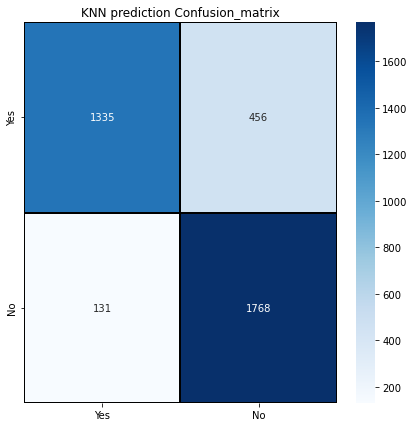

In [335]:
# Confusion Matrix for KNN classifier
cm = confusion_matrix(y_test,pred_knn)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("KNN prediction Confusion_matrix")

In [336]:
# Gradient Boosting Classifier
gb = GradientBoostingClassifier(n_estimators =100,learning_rate=0.1, max_depth=4)
gb.fit(x_train,y_train)
pred_gb = gb.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_gb))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_gb))
print("classification_report: \n",classification_report(y_test,pred_gb))

accuracy_score:  0.8780487804878049
confusion_matrix: 
 [[1620  171]
 [ 279 1620]]
classification_report: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.88      1791
           1       0.90      0.85      0.88      1899

    accuracy                           0.88      3690
   macro avg       0.88      0.88      0.88      3690
weighted avg       0.88      0.88      0.88      3690



Text(0.5, 1.0, 'Gradient Boosting classifier prediction Confusion_matrix')

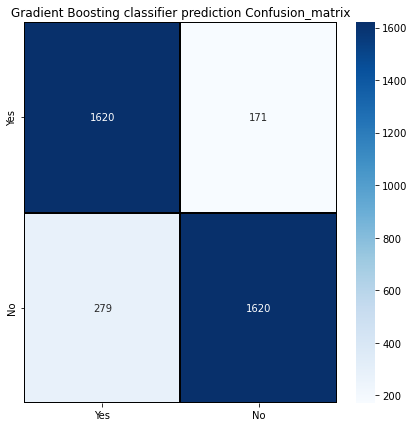

In [337]:
# Confusion Matrix for Gradient Boosting classifier
cm = confusion_matrix(y_test,pred_gb)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Gradient Boosting classifier prediction Confusion_matrix")

In [338]:
#Cross Validation Score for all the model
#CV Score for Random Forest Classifier
print('CV score for Random forest Classifier: ',cross_val_score(RFR,x1,y1,cv=5).mean())

#CV Score for Decision Tree Classifier
print('CV score for Decision Tree Classifier: ',cross_val_score(DTR,x1,y1,cv=5).mean())

#CV Score for Support Vector Classifier
print('CV score for Support Vector  Classifier: ',cross_val_score(sv,x1,y1,cv=5).mean())

#CV Score for KNN Classifier
print('CV score for KNN Classifier: ',cross_val_score(knn,x1,y1,cv=5).mean())

#CV Score for Gradient Boosting Classifier
print('CV score for Gradient Boosting Classifier: ',cross_val_score(Gb,x1,y1, cv=5).mean())

CV score for Random forest Classifier:  0.2949978450724185
CV score for Decision Tree Classifier:  -0.14823922989195565
CV score for Support Vector  Classifier:  -0.0515087422228462
CV score for KNN Classifier:  0.7973170731707317
CV score for Gradient Boosting Classifier:  0.2805008998432795


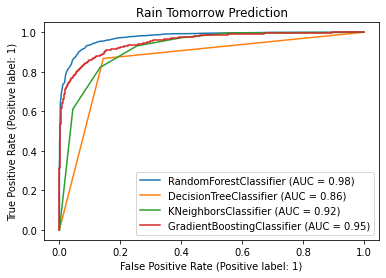

In [339]:
#  ROC & AUC Curve for all model
#Lets plot roc curve and check auc and performance of all algorithms
from sklearn.metrics import plot_roc_curve
disp = plot_roc_curve(rfc, x_test, y_test)
plot_roc_curve(dtc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax = disp.ax_)
plot_roc_curve(gb, x_test, y_test, ax = disp.ax_)
plt.title("Rain Tomorrow Prediction")
plt.legend(prop={"size" :10} ,loc = 'lower right')
plt.show()

Based on the Accuracy Score and Cross-validation Score and performance of the model we will select Random Forest Classifier as the best model compare to Gradient Boosting Classifier.

Hyper parameter tuning

The Random Forest Classifier with GridsearchCV

In [340]:
x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size = .30, random_state = 42)

In [341]:
rfc=RandomForestClassifier(random_state=30)

In [342]:
grid_params = {
                'criterion':['gini','entropy'],
                'max_depth': [15,20,22],
                'n_estimators':[700,900,1000],
                'min_samples_leaf': [1]
                }

In [343]:
CV_rfc = GridSearchCV(RandomForestClassifier(), grid_params, cv = 5)

In [344]:
CV_rfc.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [15, 20, 22], 'min_samples_leaf': [1],
                         'n_estimators': [700, 900, 1000]})

In [345]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 22,
 'min_samples_leaf': 1,
 'n_estimators': 1000}

In [346]:
Weather_Forecast=RandomForestClassifier(random_state=50, max_features='auto', n_estimators= 900, max_depth=22, criterion='entropy')
Weather_Forecast.fit(x_train,y_train)
predict=Weather_Forecast.predict(x_test)
print("accuracy score: ",accuracy_score(y_test,predict))
print("confusion_matrix: \n",confusion_matrix(y_test,predict))
print("classification_report: \n",classification_report(y_test,predict))

accuracy score:  0.9230352303523035
confusion_matrix: 
 [[1732  155]
 [ 129 1674]]
classification_report: 
               precision    recall  f1-score   support

           0       0.93      0.92      0.92      1887
           1       0.92      0.93      0.92      1803

    accuracy                           0.92      3690
   macro avg       0.92      0.92      0.92      3690
weighted avg       0.92      0.92      0.92      3690



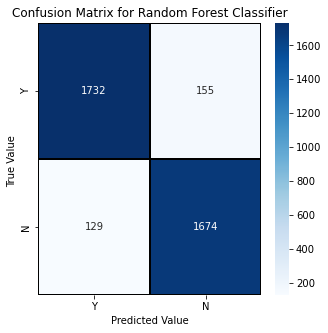

In [347]:
cm = confusion_matrix(y_test, predict)

x_axis_labels = ["Y","N"]
y_axis_labels = ["Y","N"]

f, ax = plt.subplots(figsize =(5,5))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("Predicted Value")
plt.ylabel("True Value ")
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

In [348]:
# ROC-AUC Curve
fpr, tpr, threshold = roc_curve(y_test,predict)
auc = roc_auc_score(y_test,predict)

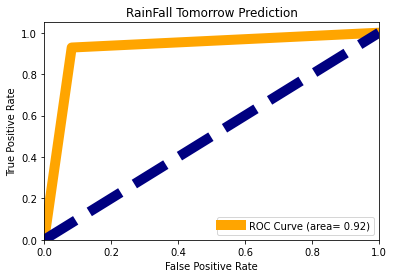

In [349]:
plt.figure()
plt.plot(fpr,tpr,color="orange",lw=10,label="ROC Curve (area= %0.2f)" % auc)
plt.plot([0,1],[0,1],color="navy",lw=10,linestyle="--")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("RainFall Tomorrow Prediction")
plt.legend(loc="lower right")
plt.show()

his is the AUC-ROC curve for the models which is plotted False positive rate against True positive rate. So the best model has the area under curve as 0.92.

In [350]:
#Saving the Model
import pickle
filename='RainFall_Tomorrow_Predict.pickle'
pickle.dump(Weather_Forecast,open(filename,'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_test)

array([1, 1, 1, ..., 1, 0, 0])

In [351]:
# Checking predicted and original values
a =np.array(y_test)
predicted=np.array(loaded_model.predict(x_test))
RainFall_Tomorrow_Prediction=pd.DataFrame({'Orginal':a,'Predicted':predicted}, index=range(len(a)))
RainFall_Tomorrow_Prediction

,Orginal,Predicted
0,1,1
1,1,1
2,1,1
3,0,0
4,1,1
...,...,...
3685,0,0
3686,1,0
3687,1,1
3688,1,0


In [352]:
#   As we can see, predicted and original values matches approx 100%.

In [353]:
model =RainFall_Tomorrow_Prediction.to_csv('RainFall_Tomorrow_Prediction.csv')
model

In [354]:
print(model)

None
